**علی بذرکار - تحلیل اکتشافی آب و هوای ایران**

# مقدمه

در این دنیای در حال تغییر الگوهای آب و هوا تأثیر زیادی بر زندگی روزمره ما دارد و درک اقلیم بیش از همیشه اهمیت دار است. در این پروژه قرار است با تحلیل  اکتشافی داده‌های هواشناسی به بررسی تفاوت های آب و هوایی از شهرهای مختلف ایران بپردازیم. این داده ها از سال ۱۳۹۰ تا به امروز را شامل می‌شوند (۲۳/۶/۱۴۰۳). با استفاده از داده‌های به دست آمده از سایت **اوپن-متئو** قصد داریم الگو ها و روابط معناداری را کشف کنیم که به ما کمک می‌کند تا تغییرات آب و هوایی منطقه‌ای را بهتر درک کنیم.

اهمیت این تحلیل فراتر از آمار ساده است؛ این تحلیل می‌تواند به بهبود شیوه‌های کشاورزی، راهنمایی برنامه‌ریزی شهری و افزایش آمادگی در برابر بلایای طبیعی کمک کند. با بررسی عواملی کلیدی مانند تغییرات دما، الگوهای بارش و تغییرات باد، می‌توانیم تصویری جامع از چگونگی تکامل روندهای اقلیمی در طول زمان ترسیم کنیم.

  من یک هنرمند متخصص در هنرهای پیکسلی، دیجیتال و طراحی چهره هستم  که علاقه مند به ریاضیات بخصوص حساب‌دیفرانسیل و آمار و‌احتمال هست. دقیقا یک سال پیش بود که با مولدهای متن و تصویر آشنا شده بودم و برای من سوال بود که این مولد ها چطور کار میکنند و چطور یاد میگیرند، دوست داشتم ریاضیات پشت این الگوریتم ها را درک کنم و همین سبب شد اولین قدم رو برای یادگیری هوش مصنوعی بگذارم. الان یک سال از اون زمان گذشته و من طی این مدت مطالب زیادی در این زمینه یاد گرفتم و با آدم های با تجربه‌ای آشنا شدم. قرار است با دانشی که در تحلیل داده بدست اورده‌ام یک پروژه جذاب تحلیلی را با یکدیگر شروع کنیم.

در این نوت‌بوک، ما به طور کلی به بررسی مجموعه داده‌ها می پردازیم و با شروع از تجسم داده‌ها، روندها و ناهنجاری‌های آب و هوا را بررسی و شناسایی میکنیم. سپس به تجزیه و تحلیل‌های دقیق‌تری خواهیم پرداخت و همبستگی‌ها و الگوهایی را کشف خواهیم کرد که ممکن است پیامدهای قابل توجهی داشته باشند. خواه شما یک محقق، سیاست‌گذار یا صرفاً یک ناظر کنجکاو باشید، هدف این تحلیل این است که یافته‌ها را به روشی جذاب و ساده ارائه دهد تا بتوانیم با یکدیگر مرحله به مرحله دانش خود را بیشتر کنیم و چیزهای جدیدی راجع به رفتار هوای اطرافمان یاد بگیریم.

این پروژه به عنوان پروژه نهایی تحلیل داده من برای **مجتمع فنی تهران (سعادت آباد)** طراحی شده و به من این امکان را می‌دهد که مهارت‌هایی را که از طریق مشارکت کلاسی به دست آورده‌ام به طور معناداری به کار ببرم و پیاده کنم. به من بپیوندید تا داستان‌های نهفته در داده‌ها را کشف کنیم و به دنیای الگوهای آب و هوایی ایران بپردازیم و با هم مسائل جدیدی یاد بگیریم!

با تشکر ویژه از استادم، **احمد مصباح** و دوستم، **امیرحسین فکاری**


# باز کردن کتابخونه ها

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from persiantools.jdatetime import JalaliDate

# آماده سازی داده ها

## باز کردن داده ها

In [50]:
geography = pd.read_csv(f"Dataset/Geography Information.csv")
geography['city'] = geography['city'].str.strip()
print(geography)

    latitude  longitude  elevation          city
0  35.676624  51.428570     1183.0        Tehran
1  38.066784  46.150738     1399.0        Tabriz
2  36.309315  59.648438      986.0       Mashhad
3  32.653778  51.695120     1579.0       Isfahan
4  29.630930  52.560837     1541.0        Shiraz
5  31.318100  48.700836       23.0         Ahvaz
6  37.293495  49.535810        4.0         Rasht
7  30.263618  57.119434     1762.0        Kerman
8  27.170473  56.224940        9.0  Bandar Abbas
9  35.817223  50.980644     1341.0         Karaj


In [51]:
# City name lists
cities = [
    "Tehran",
    "Karaj",
    "Tabriz",
    "Mashhad",
    "Isfahan",
    "Shiraz",
    "Kerman",
    "Ahvaz",
    "Bandar Abbas",
    "Rasht"
]

# list to keep dataframes
dataframes = []

# Reading DataFrames and Saving them in a dictionary
for city in cities:
    df = pd.read_csv(f"Dataset/{city}.csv")
    df['city'] = city
    dataframes.append(df)
    
del df

### ترکیب دیتاست ها

In [52]:
df_combined = pd.concat(dataframes, ignore_index=True)
df_combined = pd.merge(df_combined, geography, on='city', how='left')

## تمیزکاری داده ها

In [53]:
df = df_combined.copy()
del df_combined, dataframes, geography, cities

### بررسی داده های گمشده

In [54]:
print("Dataset Missing Values:")
missing_values = df.isnull().sum()
print(missing_values)

Dataset Missing Values:
time                               0
temp_max (°C)                      0
temp_min (°C)                      0
temp_mean (°C)                     0
daylight_duration (s)              0
precipitation_sum (mm)             0
rain_sum (mm)                      0
snowfall_sum (cm)                  0
precipitation_hours (h)            0
wind_speed_max (km/h)              0
wind_gusts_max (km/h)              0
wind_direction_dominant (°)        0
shortwave_radiation_sum (MJ/m²)    0
evapotranspiration (mm)            0
city                               0
latitude                           0
longitude                          0
elevation                          0
dtype: int64


### تنظیم کردن تاریخ شمسی و میلادی

In [55]:
df["time"] = pd.to_datetime(df["time"])

In [56]:
# create Jalali date column
df["date_jalali"] = df["time"].apply(lambda time: JalaliDate(time)) 

# rename time to date_gregorian
df.rename(columns={'time': 'date'}, inplace=True)

In [57]:

df["year"] = df["date_jalali"].apply(lambda date: date.year)
df["month"] = df["date_jalali"].apply(lambda date: date.month)
df["season"] = df["month"].apply(lambda month:
                                    "Spring" if month in [1, 2, 3] else 
                                    "Summer" if month in [4, 5, 6] else 
                                    "Autumn" if month in [7, 8, 9] else 
                                    "Winter")
df['month'] = df['month'].map({
    1: "Farvardin",
    2: "Ordibehesht",
    3: "Khordad",
    4: "Tir",
    5: "Mordad",
    6: "Shahrivar",
    7: "Mehr",
    8: "Aban",
    9: "Azar",
    10: "Dey",
    11: "Bahman",
    12: "Esfand"
})

df.drop(columns="date_jalali", inplace=True)

### تنظیم واحدها

In [58]:
df["snowfall_sum (cm)"] = df["snowfall_sum (cm)"].apply(lambda item : item * 10)
df.rename(columns={'snowfall_sum (cm)': 'snowfall_sum (mm)'}, inplace=True)

df["daylight_duration (s)"] = df["daylight_duration (s)"].apply(lambda item : item / 3600)
df.rename(columns={'daylight_duration (s)': 'daylight_duration (h)'}, inplace=True)

### ویژگی های اضافه برای تحلیل

In [59]:
df["temp_diff (°C)"] = df["temp_max (°C)"] - df["temp_min (°C)"]
df["remain_precipitation (mm)"] = df["precipitation_sum (mm)"] - df["evapotranspiration (mm)"]

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49260 entries, 0 to 49259
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   date                             49260 non-null  datetime64[ns]
 1   temp_max (°C)                    49260 non-null  float64       
 2   temp_min (°C)                    49260 non-null  float64       
 3   temp_mean (°C)                   49260 non-null  float64       
 4   daylight_duration (h)            49260 non-null  float64       
 5   precipitation_sum (mm)           49260 non-null  float64       
 6   rain_sum (mm)                    49260 non-null  float64       
 7   snowfall_sum (mm)                49260 non-null  float64       
 8   precipitation_hours (h)          49260 non-null  float64       
 9   wind_speed_max (km/h)            49260 non-null  float64       
 10  wind_gusts_max (km/h)            49260 non-null  float64  

Here are the descriptions written in fluent Persian:

### توصیف داده‌ها:
- **temp_max (°C) -** حداکثر دما ثبت‌شده در آن تاریخ.
‎  
- **temp_min (°C) -** حداقل دما ثبت‌شده در آن تاریخ.
‎  
- **temp_mean (°C) -** دمای میانگین، که به‌عنوان میانگین دماهای حداکثر و حداقل محاسبه می‌شود.
‎  
- **daylight_duration (h) -** مجموع ساعات نور روز در آن تاریخ.
‎  
- **precipitation_sum (mm) -** مجموع بارش، شامل باران و برف، به میلی‌متر ثبت‌شده.
‎  
- **rain_sum (mm) -** مقدار بارش باران، که به میلی‌متر اندازه‌گیری شده است.
‎  
- **snowfall_sum (mm) -** مقدار بارش برف، که به میلی‌متر اندازه‌گیری شده است.
‎  
- **precipitation_hours (h) -** مدت زمانی که بارش در آن ثبت شده است.
‎  
- **wind_speed_max (km/h) -** حداکثر سرعت باد ثبت‌شده در طول روز.
‎  
- **wind_gusts_max (km/h) -** بالاترین سرعت وزش باد ثبت‌شده در طول روز.
‎  
- **wind_direction_dominant (°) -** جهت غالب باد به درجه.
‎  
- **shortwave_radiation_sum (MJ/m²) -** مجموع تابش کوتاه‌موج دریافت‌شده، به‌صورت مگاژول بر متر مربع.
‎  
- **evapotranspiration (mm) -** مقدار رطوبت تبخیر و تنفس گیاهی، به میلی‌متر اندازه‌گیری شده است.
‎  
- **city -** نام شهری که داده‌ها در آن ثبت شده‌اند.
‎  
- **latitude -** مختصات عرض جغرافیایی شهر.
‎  
- **longitude -** مختصات طول جغرافیایی شهر.
‎  
- **elevation -** ارتفاع شهر، به متر.



### تمیزکردن حافظه مصرفی

In [61]:
def datatype_cleaner(df):
    
    for column in df.select_dtypes(include=['float', 'int']).columns:
        min_val = df[column].min()
        max_val = df[column].max()
    
        col_dtype = df[column].dtype
    
        # Check ranges for int and float types
        if np.issubdtype(col_dtype, np.floating):
            if min_val >= -65504 and max_val <= 65504:  # float16
                df[column] = df[column].astype(np.float16)
            elif min_val >= -3.4e38 and max_val <= 3.4e38:  # float32
                df[column] = df[column].astype(np.float32)
            else:
                df[column] = df[column].astype(np.float64)
    
        elif np.issubdtype(col_dtype, np.integer):
            if min_val >= -128 and max_val <= 127:  # int8
                df[column] = df[column].astype(np.int8)
            elif min_val >= -32768 and max_val <= 32767:  # int16
                df[column] = df[column].astype(np.int16)
            elif min_val >= -2147483648 and max_val <= 2147483647:  # int32
                df[column] = df[column].astype(np.int32)
            else:
                df[column] = df[column].astype(np.int64)

In [62]:
# calling the function to clean datatype memory usage
datatype_cleaner(df)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49260 entries, 0 to 49259
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   date                             49260 non-null  datetime64[ns]
 1   temp_max (°C)                    49260 non-null  float16       
 2   temp_min (°C)                    49260 non-null  float16       
 3   temp_mean (°C)                   49260 non-null  float16       
 4   daylight_duration (h)            49260 non-null  float16       
 5   precipitation_sum (mm)           49260 non-null  float16       
 6   rain_sum (mm)                    49260 non-null  float16       
 7   snowfall_sum (mm)                49260 non-null  float16       
 8   precipitation_hours (h)          49260 non-null  float16       
 9   wind_speed_max (km/h)            49260 non-null  float16       
 10  wind_gusts_max (km/h)            49260 non-null  float16  

In [63]:
df.to_csv("Final Dataset.csv", index=False)

# مصورسازی داده ها

## تحلیل دما

### نمودار خطی / زمانی

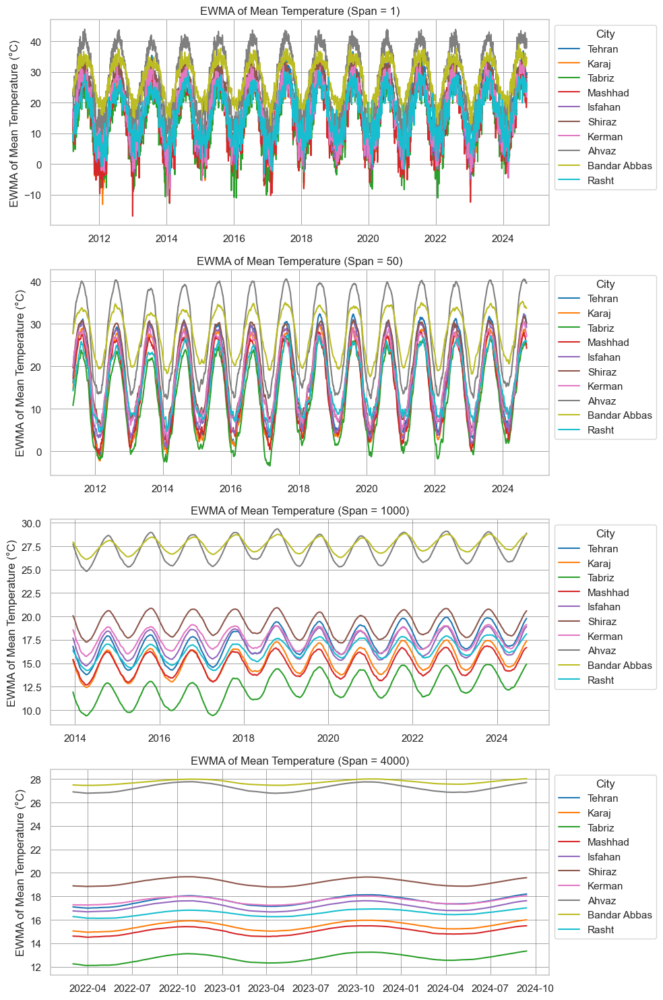

In [64]:
spans = [1, 50, 1000, 4000]
pallet = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

fig, axs = plt.subplots(len(spans), 1, figsize=(10, 15))
sns.set_style("whitegrid")
cities = df['city'].unique()

for i, span in enumerate(spans):
    for j, city in enumerate(cities):
        city_data = df[df['city'] == city].set_index('date')
        ewma_temp = city_data['temp_mean (°C)'].ewm(span=span).mean()
        
        # Determine the starting point for plotting
        start_index = ewma_temp.index[span - 1]
        axs[i].plot(ewma_temp.index[span - 1:], ewma_temp[span - 1:], label=city, color=pallet[j % len(pallet)])

    axs[i].set_title(f"EWMA of Mean Temperature (Span = {spans[i]})")
    axs[i].set_ylabel("EWMA of Mean Temperature (°C)")
    axs[i].legend(title="City", bbox_to_anchor=(1, 1), loc='upper left')
    axs[i].grid(True, color='gray', linewidth=0.5) 

plt.tight_layout()
plt.show()

del spans, pallet, axs, fig, city_data, ewma_temp, cities, start_index

**- تحلیل نمودار -**

روند دما در شهرهای مختلف ایران الگوهای کلیدی متعددی را نشان می‌دهد. اهواز و بندرعباس به طور مداوم بالاترین دماها را ثبت می‌کنند، به طوری که اهواز نوسانات بیشتری دارد و تا ۲۵ درجه سانتی‌گراد اختلاف دما را تجربه میکند ولی بندرعباس حدودا تا ۱۵ درجه سانتی‌گراد اختلاف دارد. این نشان می‌دهد که اختلاف و بازه اقلیم اهواز شدیدتر است و نوسانات تندتری را در طول سال تجربه میکند. این امر احتمالاً تحت تأثیر اقلیم بیابانی داخلی اهواز نسبت به تعدیل ساحلی بندرعباس است.

کرج و مشهد، با وجود تفاوت‌های جغرافیایی، الگوهای دمایی مشابهی را نشان می‌دهند و دماهای نسبتاً پایین‌تری را در مقایسه با رشت، تهران و شهرهای مرکزی مانند کرمان، اصفهان و شیراز حفظ می‌کنند. تهران، اگرچه از نظر جغرافیایی در موقعیت مرکزی قرار ندارد، اما اغلب دماهای بالاتری نسبت به شهرهایی مانند اصفهان و رشت تجربه می‌کند، که نشان‌دهنده عوامل اقلیمی منحصربه‌فردی است که به گرمای بالای آن کمک می‌کند. این مورد ممکن است به اثرات حرارتی شهری مربوط شود، مثل تراکم و جمعیت شهری و عوامل جغرافیایی مانند کوه‌های اطراف تهران.

تبریز هم به طور قابل توجهی، به عنوان سردترین شهر در میان شهرهای مورد تحلیل شناخته می‌شود، با وجود نزدیکی‌ دمای آن به شهرهایی مثل مشهد و کرج دمای پایین‌تر آن، اقلیم منحصربه‌فرد آن را برجسته می‌کند که می‌توانیم این مسئله را به ارتفاع و عرض جغرافیایی آن نسبت دهیم.

نکته قابل توجه این است که با وجود برخی نوسانات کوچک در داده‌ها در طول سال‌ها، تمام شهرها الگوی دمایی مشابهی را نشان می‌دهند، که بیان کننده تأثیرات فصلی مداوم در سطح ملی است. این الگوی مشترک ممکن است نشان‌دهنده رویدادهای اقلیمی وسیع‌تر نیز باشد ولی چیزی که اینجا بنظر میاید این است که این تغییرات دوره‌های دمایی فصلی و معمولی باشند که به طور یکنواخت بر کل کشور تأثیر می‌گذارند.

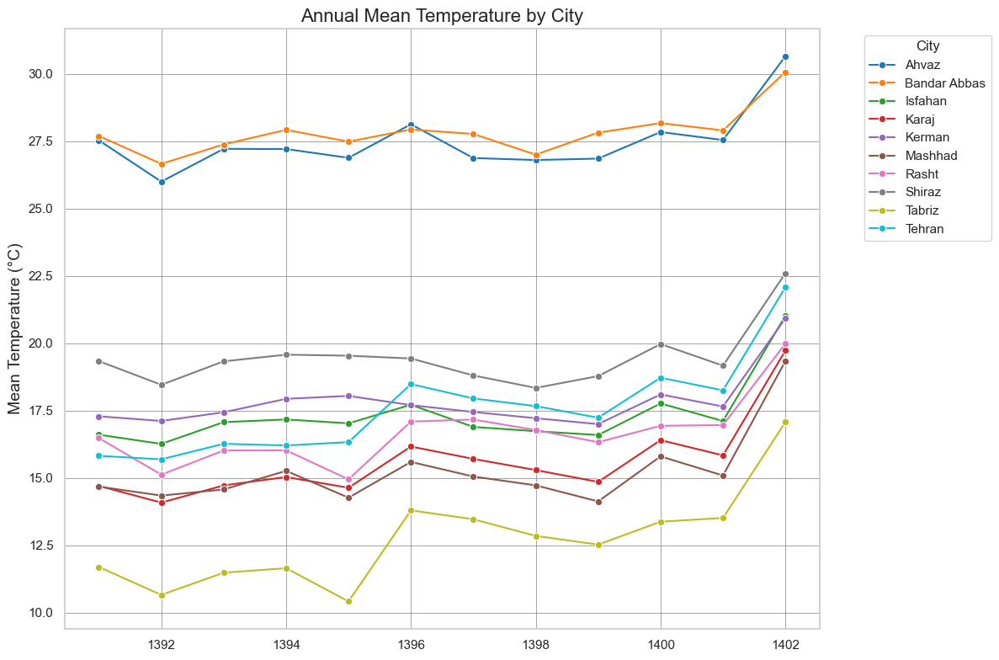

In [65]:
pallet = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

temp = df.copy()
temp = temp[(temp["date"] > "2012-03-21") & ("2024-01-01" > temp["date"])]
annual_mean_temp = temp.groupby(['year', 'city'])['temp_mean (°C)'].mean().reset_index()
annual_mean_temp = annual_mean_temp.sort_values(by=['year', 'city'])

plt.figure(figsize=(10, 8))

sns.lineplot(data=annual_mean_temp, x='year', y='temp_mean (°C)', hue='city', marker='o', palette=pallet)
plt.title("Annual Mean Temperature by City", fontsize=16)
plt.xlabel("")
plt.ylabel("Mean Temperature (°C)", fontsize=14)
plt.grid(True)

plt.tight_layout()
plt.legend(title="City", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5)
plt.show()

del temp, annual_mean_temp, pallet

  **- تحلیل نمودار -**

تحلیل دمای میانگین سالانه از سال ۱۳۹۱ تا ۱۴۰۲ نشان‌دهنده یک روند مداوم از افزایش دما در تمامی شهرها است که حکایت از گرم شدن اقلیم در دهه گذشته را دارد. به‌ویژه در سال پایانی (۱۴۰۲)، افزایش قابل توجهی در دمای میانگین سالانه برای تمام شهرها مشاهده میشود که با مشاهدات جهانی افزایش دما که احتمالاً تحت تأثیر تغییرات اقلیمی قرار دارد، هم‌ راستا است. 

جالب اینجاست در حالی که همه شهرها به طور کلی روند بلند مدت مشابهی از افزایش دما را نشان می‌دهند، تغییرات دمایی خاص آن‌ها همیشه به طور کامل با یکدیگر در هر سال هم‌ راستا نیستند. این امر در برخی سال‌ها، مانند ۱۳۹۲، ۱۳۹۵ و ۱۳۹۹، مشهود است که در آن‌ها دما در مقایسه با سال قبل کاهش یافته و سپس در سال بعدی افزایش یافته است. این نوسانات ممکنه به رویدادهای اقلیمی محلی، مانند تغییرات بارش فصلی، جبهه‌های سرد غیرمعمول، یا سایر ناهنجاری‌های آب و هوایی که بر مناطق خاص به‌طور متفاوت تأثیر می‌گذارند، مربوط باشند 

داده‌ها نشان می‌دهند که حتی داخل یک روند کلی گرم شدن، نوساناتی در سطح منطقه‌ای وجود دارد که باعث تغییرات در رفتار دما در شهرها می‌شود، هرچند که لزوماً روندها متضاد نیستند. برای مثال، در سال ۱۳۹۵، در حالی که اکثر شهرها کاهش دما را نسبت به سال‌های قبل و بعد تجربه کردند، کرمان این کاهش را نشان نداد، که نشان‌دهنده تأثیرات منطقه‌ای منحصربه‌فردی است که بر اقلیم آن تأثیر گذاشته. این موضوع پیچیدگی الگوهای اقلیمی منطقه‌ای را برجسته می‌کند که در آن عوامل محلی مانند جغرافیا، شهرنشینی و ارتفاع می‌تواند به رفتارهای آب و هوایی متمایز کمک کند. 

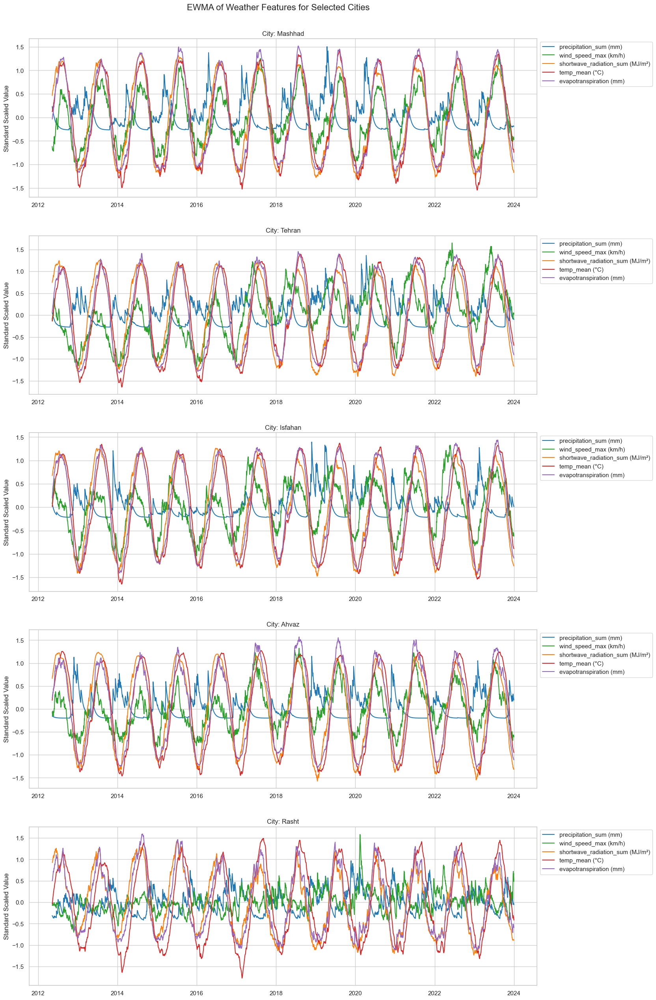

In [66]:
temp = df.copy()
temp = temp[(temp["date"] > "2012-03-21") & ("2024-01-01" > temp["date"])]
temp.set_index('date', inplace=True)
selected_cities = ["Mashhad", "Tehran", "Isfahan", "Ahvaz", "Rasht"]
temp = temp[temp['city'].isin(selected_cities)]
features = ["precipitation_sum (mm)", "wind_speed_max (km/h)", 
            "shortwave_radiation_sum (MJ/m²)", "temp_mean (°C)", "evapotranspiration (mm)"]
pallet = ['#1f77b4', '#2ca02c', '#ff7f0e', '#d62728', '#9467bd']
scaler = StandardScaler()

fig, axes = plt.subplots(5, 1, figsize=(15, 26), sharex=True)
fig.tight_layout(pad=5.0)
axes = axes.flatten()  # Flatten the axes for easier indexing

span = 50

for i, city in enumerate(selected_cities):
    city_df = temp[temp['city'] == city].copy()
    
    scaled_features = scaler.fit_transform(city_df[features])
    scaled_df = pd.DataFrame(scaled_features, columns=features, index=city_df.index)
    ewma_df = scaled_df.ewm(span=span).mean()
    
    ax = axes[i]
    start_index = span - 1  # Start after EWMA has had sufficient data points to stabilize
    for j, feature in enumerate(features):
        ax.plot(ewma_df.index[start_index:], ewma_df[feature].iloc[start_index:], label=feature, color=pallet[j])

    ax.set_title(f'City: {city}')
    ax.set_ylabel('Standard Scaled Value')
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left')
    ax.tick_params(axis='x', which='both', labelbottom=True)

axes[-1].set_xlabel('')
plt.suptitle('EWMA of Weather Features for Selected Cities', fontsize=16, y=1)
plt.show()

del i, city, selected_cities, start_index, city_df, scaler, scaled_df, scaled_features, features, temp, pallet


 **- مستندسازی -**

برای سادگی تحلیل مشهد، اصفهان، اهواز، تهران و رشت به عنوان شهرهای نماینده بر اساس موقعیت جغرافیایی انتخاب شده‌اند به دلیل ویژگی‌های اقلیمی که الگوهای گسترده‌تری از آب و هوا در ایران را منعکس می‌کنند. هر شهر رفتارهای منحصر به فرد دما و بارش را نشان می‌دهد، به طوری که مشهد، اصفهان و رشت تأثیرات اقلیمی مشابهی را به نمایش می‌گذارند و این شباهت برای اصفهان، کرمان و شیراز سهیم است. این در حالی است که اهواز و بندرعباس شرایط گرم‌تر و خشک‌تری را تجربه می‌کنند. با اینکه تهران قرار بود در گروه مشهد قرار گیرد، اما تصمیم گرفتم که به دلیل رفتار اقلیمی متفاوتش و گرمای بیشتر نسبت به هم گروهان خود، آن را نیز در تحلیل خود گنجانده و بررسی کنیم. تحلیل این شهرها بینش‌های ارزشمندی در مورد روندهای اقلیمی منطقه‌ای، تأثیرات شهرنشینی و پیامدهای گسترده‌تر تغییرات اقلیمی در این منطقه ارائه می‌دهد.

 **- تحلیل نمودار -**

تحلیل پنج شهر انتخابی؛ یعنی مشهد، اصفهان، اهواز، تهران و رشت، الگوهای جالبی در دما، تابش اشعه کوتاه خورشید، سرعت باد، بارش و تبخیر/تعرق را نشان می‌دهد. در تمامی این 5 شهر، دما و تابش اشعه کوتاه به طور همزمان تغییر می‌کنند و رابطه مستقیمی را نشان می‌دهند، به طوری که تابش اشعه کوتاه معمولاً بر افزایش دما تأثیر می‌گذارد. این رابطه مشهود است زیرا تابش اشعه کوتاه به نظر می‌رسد که دما را به‌طور سریع‌تری تحت تأثیر قرار می‌دهد، به‌طوری که با افزایش نور خورشید، گرما نیز در این شهرها افزایش می‌یابد. به‌طور مشابه، تبخیر/تعرق نیز رابطه مستقیمی با هر دو عامل تابش اشعه کوتاه و دما دارد و با افزایش تابش خورشیدی و دما افزایش می‌یابد. در چهار شهر اول سرعت باد نیز رابطه مستقیمی را نشان می‌دهد و روند قابل توجهی دارد که در آن سرعت بادها معمولاً با تغییر فصل از زمستان به بهار افزایش می‌یابد، که تغییرات فصلی دما را منعکس می‌کند.

به صورت بصری میتوان دید بارش باران و برف در این چهار شهر اول نشان‌دهنده رابطه غیرمستقیم با دما، تابش و تبخیر/تعرق است. البته باید اشاره کرد که رویدادهای بارش به‌طور مستقیم تحت تأثیر این عوامل نیستند، بلکه بیشتر تحت تأثیر الگوهای اقلیمی فصلی قرار دارند. زمانی که دما پایین رفته به طور طبیعی در این چهار شهر فصل زمستان بوده که بارش در این فصول کاملا طبیعی است

رشت، به دلیل نزدیکی به دریای خزر، مورد منحصر به فردی است. این شهر سطوح بالاتری از رطوبت و بارش‌های بیشتری را به‌ویژه در زمستان و اوایل بهار تجربه می‌کند. این منجر به رابطه غیرمستقیم بین بارش و دما می‌شود، زیرا افزایش رطوبت می‌تواند با کاهش دما به بارش منجر شود. علاوه بر این، سرعت باد در رشت به‌طور متفاوتی عمل می‌کند، زیرا تحت تأثیر نسیم‌های دریایی قرار دارد که الگوهای باد محلی را ایجاد می‌کنند. در حالی که تابش اشعه کوتاه، تبخیر/تعرق و دما همچنان رابطه‌های مشابهی با دیگر شهرها نشان می‌دهند، رطوبت بالاتر و پوشش ابر در رشت می‌تواند تابش خورشید را کاهش دهد و بر تغییرات دما در این منطقه تأثیر بگذارد. به‌طور کلی، این یافته‌ها پیچیدگی تعاملات اقلیمی در مناطق مختلف را برجسته می‌کند و نقش جغرافیا و عوامل هواشناسی محلی را در شکل‌دهی الگوهای آب و هوایی تأکید می‌کند.


### بررسی پراکندگی دما

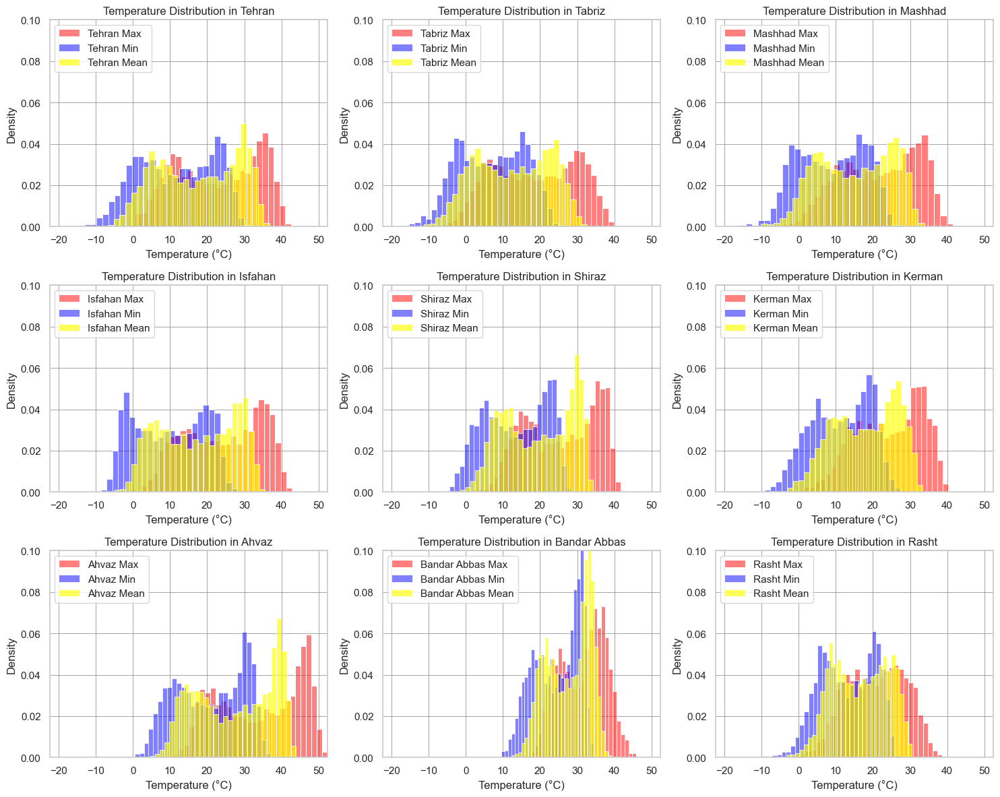

In [67]:
cities = [city for city in df['city'].unique() if city != 'Karaj']
overall_min = df[['temp_min (°C)', 'temp_mean (°C)', 'temp_max (°C)']].min().min()
overall_max = df[['temp_min (°C)', 'temp_mean (°C)', 'temp_max (°C)']].max().max()

plt.figure(figsize=(15, 12))
sns.set(style="whitegrid")

for i, city in enumerate(cities, 1):
    plt.subplot(3, 3, i)
    subset = df[df['city'] == city]
    
    sns.histplot(subset['temp_max (°C)'], bins=30, kde=False, color='red', alpha=0.5, label=f'{city} Max', stat='density')
    sns.histplot(subset['temp_min (°C)'], bins=30, kde=False, color='blue', alpha=0.5, label=f'{city} Min', stat='density')
    sns.histplot(subset['temp_mean (°C)'], bins=30, kde=False, color='yellow', alpha=0.65, label=f'{city} Mean', stat='density')

    # Set x and y limits for uniformity
    plt.xlim(overall_min, overall_max)
    plt.ylim(0, 0.1) 

    plt.title(f'Temperature Distribution in {city}')
    plt.xlabel('Temperature (°C)')
    plt.ylabel('Density')
    plt.legend(loc='upper left')
    plt.grid(True, color='gray', linewidth=0.5)

plt.tight_layout()
plt.show()

del cities, subset, overall_max, overall_min

 **- تحلیل نمودار -**
 
این نمودار توزیع دماهای حداکثر (بیشترین دمای آن روز)، حداقل (کم ترین دمای آن روز) و میانگین در شهرهای انتخاب‌شده، بینش‌های مهمی را درباره الگوهای اقلیمی آن‌ها نشان می‌دهد. اصفهان، تبریز و مشهد تراکم قابل توجهی در دماهای حداقل، به‌ویژه در محدوده -۵ درجه سانتی‌گراد دارند که احتمالاً در ماه‌های سرد زمستان رخ می‌دهد. در مقابل، اهواز در دماهای حداکثر پیشتاز است و به‌طور مکرر دمای ۵۰ درجه سانتی‌گراد و اوج حدود ۴۵ درجه سانتی‌گراد را تجربه می‌کند که نشان‌دهنده آب و هوای گرم‌تر آن نسبت به بندرعباس است که این موضوع در نمودارهای دمای روزانه قبلی نیز مشهود است.

برای دماهای میانگین، تهران، شیراز و اصفهان در تابستان غالبا دمای ۳۰ درجه سانتی‌گراد و در زمستان ۵ درجه سانتی‌گراد را نشان می‌دهند که نشان‌دهنده تغییرات فصلی معمولی است. اهواز در تابستان دمای میانگین ۴۰ درجه سانتی‌گراد و در زمستان دامنه‌ای بین ۱۰ تا ۲۰ درجه سانتی‌گراد را نشان می‌دهد، در حالی که بندرعباس در تابستان میانگین دمای ۳۵ درجه سانتی‌گراد را به عنوان بالاترین دمای میانگین در بین شهرها دارد و در زمستان دمای حدود ۲۰ درجه سانتی‌گراد دارد. این بینش‌ها نمایه‌های دمایی متمایز هر شهر را برجسته می‌کنند و تأثیر تغییرات فصلی و عوامل جغرافیایی را بر اقلیم آن‌ها تأکید می‌کنند.


### تحلیل فصلی

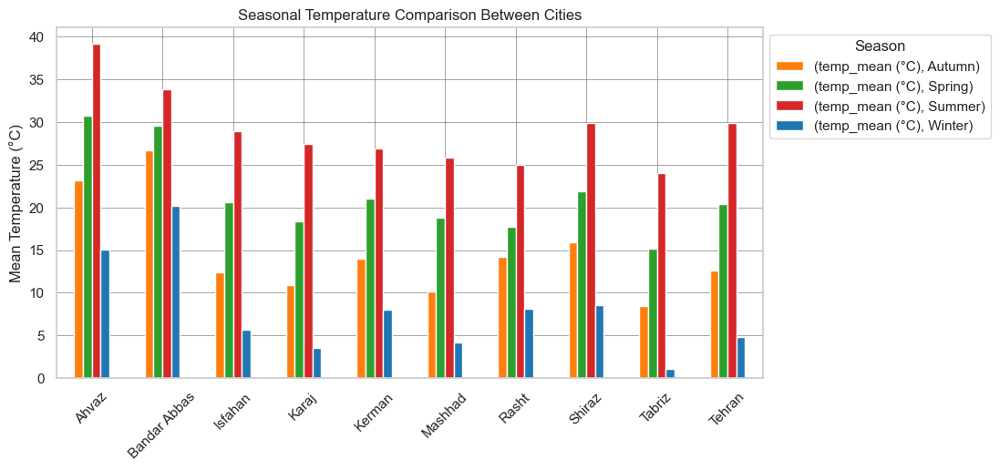

In [68]:
city_season_trends = df.groupby(['city', 'season']).agg({
    'temp_mean (°C)': 'mean',
}).unstack()

pallet = ['#ff7f0e', '#2ca02c', '#d62728', '#1f77b4']
ax = city_season_trends.plot(kind='bar', figsize=(10, 5), color=pallet)

plt.title("Seasonal Temperature Comparison Between Cities")
plt.xlabel("")
plt.ylabel("Mean Temperature (°C)")
plt.legend(title="Season", bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 
plt.xticks(rotation=45)
plt.show()

del city_season_trends

#### بررسی اختلاف دما

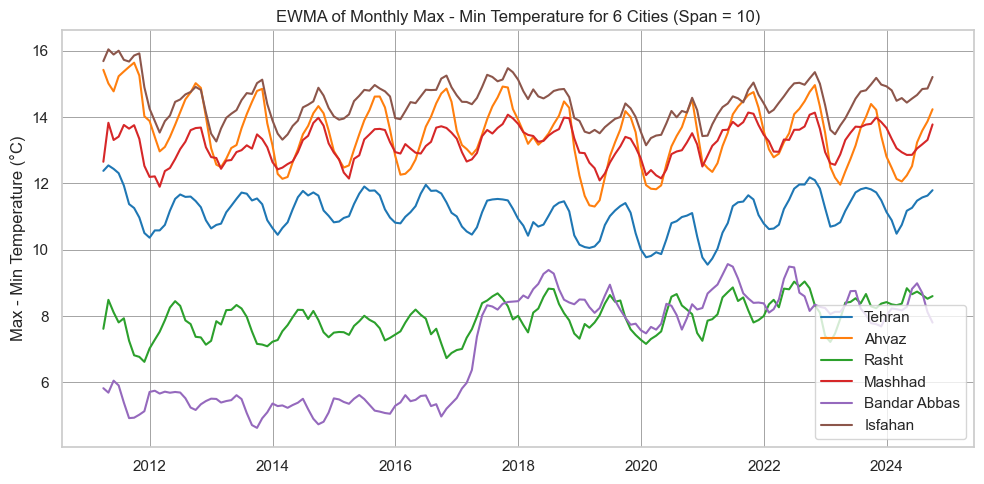

In [69]:
important_cities = ['Tehran', 'Ahvaz', 'Rasht', 'Mashhad', 'Bandar Abbas', 'Isfahan']
filtered_data = df[df['city'].isin(important_cities)]
span = 10
pallet = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9569bd', '#8c564b']

plt.figure(figsize=(10, 5))

for idx, city in enumerate(important_cities):
    city_data = filtered_data[filtered_data['city'] == city]
    city_monthly = city_data.resample('ME', on='date').mean(numeric_only=True)
    ewma_max_minus_min = city_monthly['temp_diff (°C)'].ewm(span=span).mean()
    plt.plot(ewma_max_minus_min.index, ewma_max_minus_min, label=city, color=pallet[idx])

plt.title(f"EWMA of Monthly Max - Min Temperature for {len(important_cities)} Cities (Span = {span})")
plt.xlabel("")
plt.ylabel("Max - Min Temperature (°C)")
plt.legend()
plt.grid(True, color='gray', linewidth=0.5)  
plt.tight_layout()
plt.show()

del important_cities, filtered_data, pallet, span, city_data, city_monthly, ewma_max_minus_min

 **- تحلیل نمودار -**

نمودار تفریق دماهای حداکثر و حداقل الگوهای جالبی را در بین شهرهای انتخاب‌شده نشان می‌دهد که به جز بندرعباس، همه‌ی آن‌ها نوسانات سالانه مشابهی را تجربه می‌کنند. بندرعباس تا سال ۲۰۱۷ از این الگوها پیروی می‌کرد، اما پس از آن به‌طور ناگهانی محدوده تغییرات دما حدود ۵ درجه سانتی‌گراد افزایش یافت و سپس از همان 5 درجه بالاتر شروع به نوسان با الگوی تغییرات دمایی سالانه قبلی خود کرد. این تغییر غیرمنتظره با تأثیرات گسترده‌تر تغییرات اقلیمی در منطقه مرتبط است که با افزایش دما و تغییر الگوهای آب‌وهوایی همراه است. براساس تحقیقات، میانگین دمای سالانه بندرعباس اکنون حدود ۲۷.۵ درجه سانتی‌گراد است و روند افزایشی ۰.۲ درجه سانتی‌گراد در هر دهه دارد. این تغییرات اقلیمی باعث طولانی‌تر و گرم‌تر شدن تابستان‌ها و کوتاه‌تر شدن زمستان‌ها شده است، که نیاز به انرژی را افزایش داده و خطرات سلامت را تشدید کرده است. علاوه بر این، منطقه با چالش‌هایی مانند فرسایش سواحل و رخدادهای شدید آب‌وهوایی مواجه است که بر محیط زیست و اقتصاد محلی تأثیر می‌گذارند. سازگاری با این تغییرات برای اطمینان از پایداری آینده شهر ضروری است.

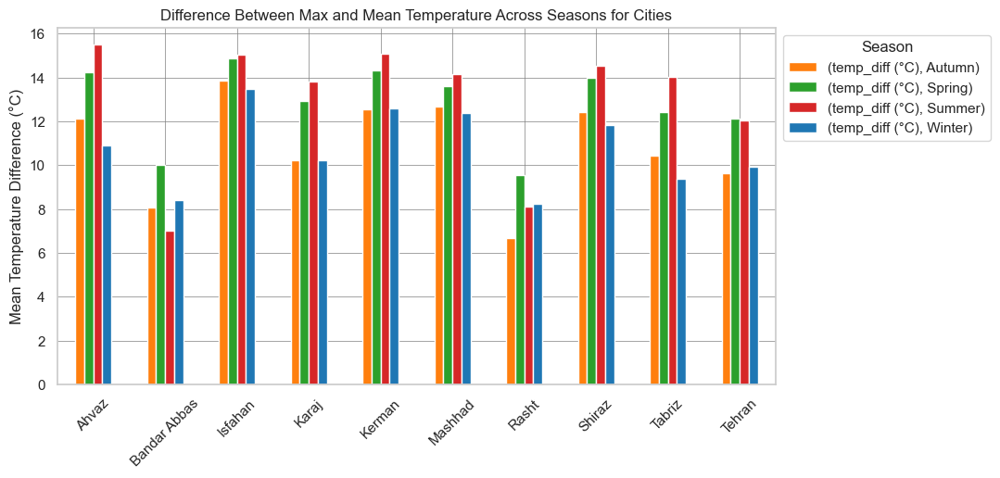

In [70]:
temp = df.copy()
temp = temp[temp["date"] >= "2018-01-01"]
city_season_trends = temp.groupby(['city', 'season']).agg({'temp_diff (°C)': 'mean'}).unstack()
pallet = ['#ff7f0e', '#2ca02c', '#d62728', '#1f77b4']

ax = city_season_trends.plot(kind='bar', figsize=(10, 5), color=pallet)

plt.title("Difference Between Max and Mean Temperature Across Seasons for Cities")
plt.xlabel("")
plt.ylabel("Mean Temperature Difference (°C)")
plt.xticks(rotation=0)
plt.legend(title="Season", bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 
plt.xticks(rotation=45)
plt.show()

del city_season_trends, pallet, ax, temp

 **- مستندسازی -**

برای تحلیل های درست تر تصمیم گرفتم تغییرات فصلی بعد از سال 2018 را مورد بررسی قرار دهم تا تغییرات اقلیمی بندعباس در این سال سبب نتایج نادرست نشده باشد

#### نمودار جعبه‌ای فصلی

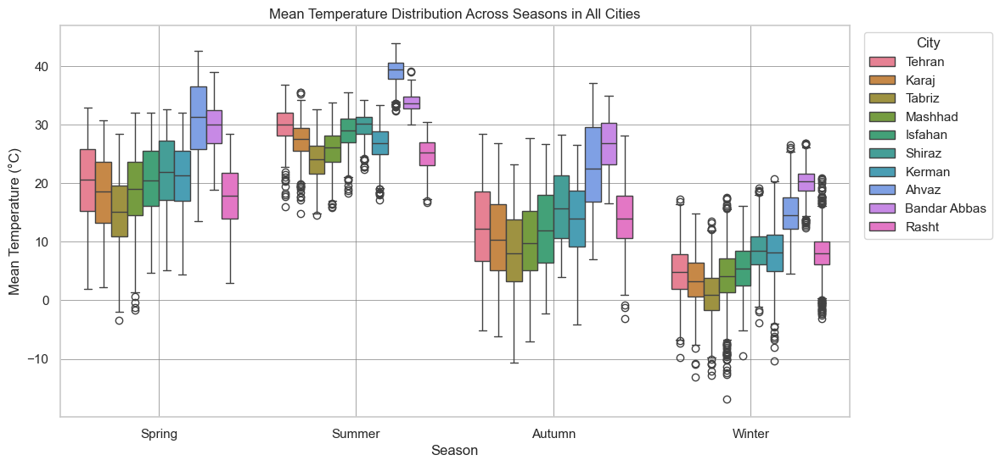

In [71]:
plt.figure(figsize=(12, 6))
sns.set_palette('rainbow')
sns.boxplot(x='season', y='temp_mean (°C)', hue='city', data=df)
plt.title("Mean Temperature Distribution Across Seasons in All Cities")
plt.ylabel("Mean Temperature (°C)")
plt.xlabel("Season")
plt.legend(title='City', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 
plt.show()

 **- مستندسازی نحوه برخورد با داده های پرت -**

در این تحلیل داده‌های دما، من نقاط دورافتاده‌ای را به‌عنوان "انحراف" شناسایی میکنم، و انها را خطا در نظر نمی‌گیرم. با توجه به ماهیت داده‌های سری زمانی، که الگوهای آب‌وهوایی اغلب تحت تأثیر عوامل مختلف اقلیمی دارای تغییرات هستند، نگه‌داشتن این انحرافات بسیار مهم هست. حذف یا کاهش آن‌ها با ضرایب و وزن دهی به داده ها می‌تواند منجر به تحریف روندها و نتایج عددی همبستگی‌هادر دیتاست شود. با حفظ این انحرافات، اطمینان حاصل شد که تحلیل، روابط واقعی بین دما و سایر ویژگی‌های آب‌وهوایی را در طول زمان نشان دهد. این رویکرد اجازه می‌دهد که ارزیابی درست تری از نحوه تعامل این متغیرها انجام شود و به درک عمیق‌تری از رفتار اقلیمی در بین شهرهای انتخاب‌شده کمک شایانی می‌کند. حفظ یکپارچگی دیتاست ها به این شکل، قابل‌اعتماد بودن یافته‌ها  را تضمین می‌کند و نتیجه‌گیری‌های انجام‌شده از تحلیل را دقیق تر می‌نماید.


 **- تحلیل نمودار -**

باکس‌پلات‌ها چندین نکته مهم درباره توزیع دما در شهرهای منتخب در طول فصل‌ها را آشکار می‌کنند. برای مثال اینکه بندرعباس در فصل‌های زمستان و پاییز بالاترین دماها را نسبت به دیگر شهرها داشته، درحالی‌که اهواز در دماهای بهار و تابستان پیشتاز است. تهران و اصفهان الگوهای دمایی مشابهی را در تمام فصول نشان می‌دهند که حاکی از رفتار اقلیمی ثابت آن‌هاست. نکته جالب این است که کرمان و رشت در زمستان و پاییز دمای میانگین یکسانی دارند؛ اما کرمان در این فصول نوسانات دمایی بیشتری را نشان می‌دهد.

همچنین، تبریز به‌عنوان سردترین شهر در هر چهار فصل شناخته می‌شود که با تحلیل‌های نمودار های قبلی به دمای مداوم پایین آن نسبت به شهر های دیگه همخوانی دارد. این نگاه جامع به توزیع دما، فهم ما از ویژگی‌های اقلیمی منحصر به هر شهر را تقویت می‌کند و امکان تفسیرهای دقیق‌تری از داده‌ها فراهم می‌سازد.

### بررسی همبستگی

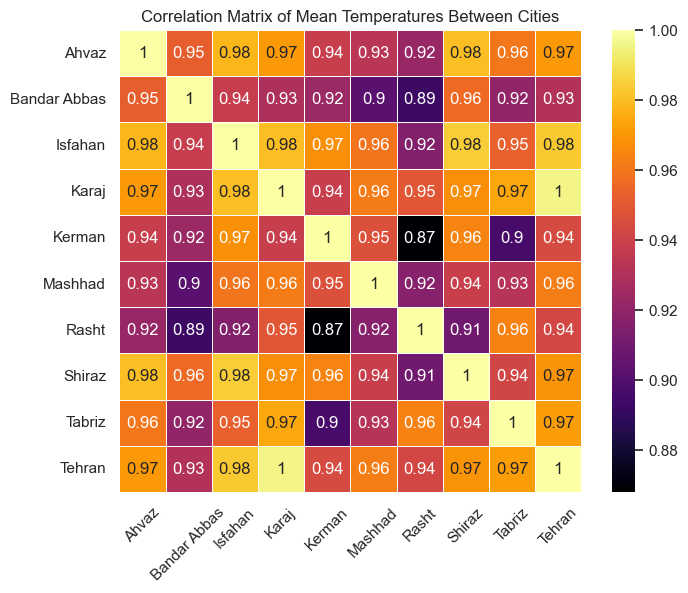

In [72]:
df_pivot = df.pivot_table(index='date', columns='city', values='temp_mean (°C)')
correlation_matrix = df_pivot.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="inferno", linewidths=0.5, square=True)
plt.title('Correlation Matrix of Mean Temperatures Between Cities')
plt.xticks(rotation=45)
plt.xlabel("")
plt.ylabel("")
plt.show()

del correlation_matrix, df_pivot

 **- تحلیل نمودار -**

ماتریس نمودار همبستگی، رابطه مثبت قوی بین دماهای شهرهای منتخب را نشان می‌دهد که در آن همه شهرها ضریب همبستگی بالاتر از 0.87 دارند. این امر بیانگر وجود رابطه مستقیم قابل توجهی در روند دماها در این مکان‌ها است. جالب اینجاست که برخی از شهرها به همبستگی نزدیک به 1 می‌رسند که به معنای هماهنگی تقریباً کامل در تغییرات دمایی آن‌هاست که علت آن نزدیکی دو شهر و کنار یکدیگر بودن است. مثل کرج و تهران که ضریبی دقیقا برابر با 1 دارند. با این حال تهران در اغلب فصل‌ها گرم‌تر از کرج است و گرمای مشابهی با اصفهان دارد ولی رفتار آن متناسب با منطقه آن بوده و به همین دلیل همبستگی آن‌ با کرج دقیقاً 1 باقی می‌ماند

## تحلیل میزان بارش

### نمودار خطی / زمانی

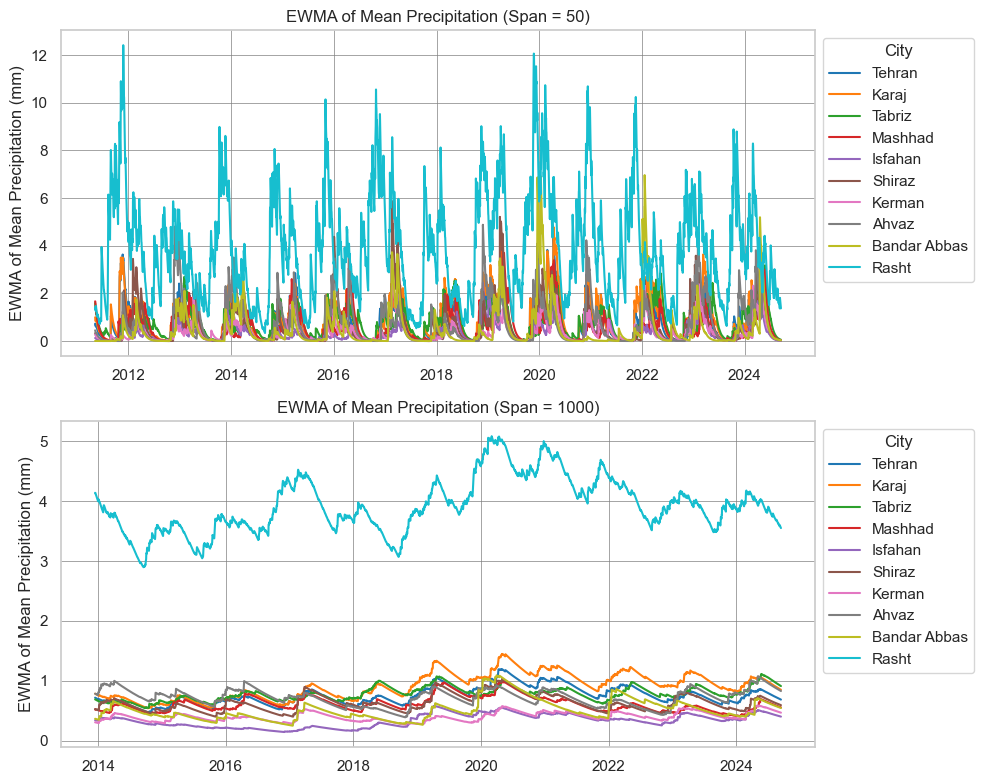

In [73]:
spans = [50, 1000]
pallet = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

fig, axs = plt.subplots(len(spans), 1, figsize=(10, 8))
cities = df['city'].unique()

for i, span in enumerate(spans):
    for j, city in enumerate(cities):
        city_data = df[df['city'] == city].set_index('date')
        ewma_evap = city_data['precipitation_sum (mm)'].ewm(span=span).mean()
        
        # Determine the starting point for plotting
        start_index = ewma_evap.index[span - 1]
        axs[i].plot(ewma_evap.index[span - 1:], ewma_evap[span - 1:], label=city, color=pallet[j % len(pallet)])

    axs[i].set_title(f"EWMA of Mean Precipitation (Span = {spans[i]})")
    axs[i].set_ylabel("EWMA of Mean Precipitation (mm)")
    axs[i].legend(title="City", bbox_to_anchor=(1, 1), loc='upper left')
    axs[i].grid(True, color='gray', linewidth=0.5) 

plt.tight_layout()
plt.show()

del spans, pallet, fig, axs, cities, city_data, ewma_evap

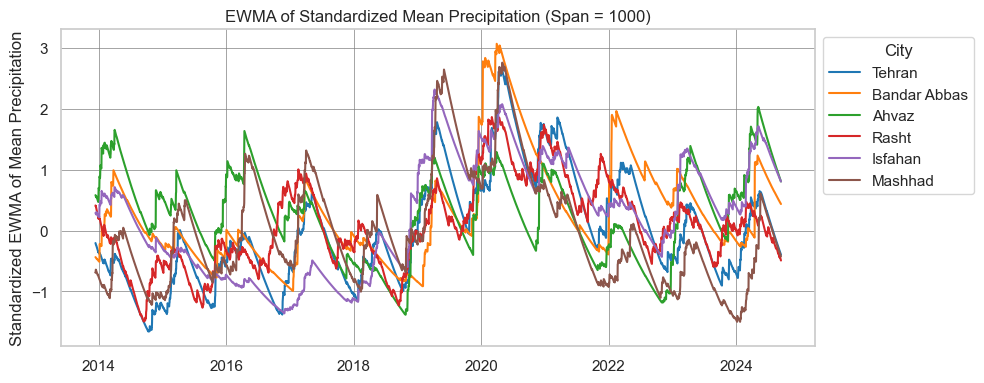

In [74]:
span = 1000  
pallet = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',   
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
selected_cities = ["Tehran", "Bandar Abbas", "Ahvaz", "Rasht", "Isfahan", "Mashhad"]

fig, ax = plt.subplots(figsize=(10, 4))

for j, city in enumerate(selected_cities):  
    city_data = df[df['city'] == city].set_index('date')  
    ewma_evap = city_data['precipitation_sum (mm)'].ewm(span=span).mean()
    ewma_evap_standardized = (ewma_evap - ewma_evap.mean()) / ewma_evap.std()
    
    ax.plot(ewma_evap_standardized.index[span - 1:], 
            ewma_evap_standardized[span - 1:], 
            label=city, color=pallet[j % len(pallet)])  

ax.set_title(f"EWMA of Standardized Mean Precipitation (Span = {span})")  
ax.set_ylabel("Standardized EWMA of Mean Precipitation")  
ax.legend(title="City", bbox_to_anchor=(1, 1), loc='upper left')  
ax.grid(True, color='gray', linewidth=0.5)

plt.tight_layout()  
plt.show()

del span, pallet, fig, ax, selected_cities, city_data, ewma_evap

 **- تحلیل نمودار -**

برای تحلیل سرعت باد در نگاه اول، الگوهای بارش در شهرهای مختلف تا حد زیادی نامنظم به نظر می‌رسند و هیچ روند واضح یا قابل پیش‌بینی وجود ندارد. به عنوان مثال، در برخی سال‌ها بندرعباس شاهد افزایش ناگهانی بارش است، در حالی که کرج در سال‌های اخیر بارش بیشتری داشته است. هرچند مواردی وجود دارد که شهرها رفتار مشابهی در زمینه بارش نشان می‌دهند، اما این موارد نسبت به دما و دیگر ویژگی‌ها کمتر پایدار هستند. با این حال رابطه مستقیم ضعیفی با وجود این بی ثباتی بین بارش در این شهرها وجود دارد.

رشت با مجموع بارش‌های قابل توجه خود از دیگر شهرها متمایز است، به‌طوری که گویی هیچ ارتباطی با بقیه شهرها ندارد. با این حال، هنگامی که نمودارهای خطی را با مقیاس استاندارد شده  میسنجیم، مشخص می‌شود که رشت نیز از لحاظ بارش رابطه مستقیم با دیگر شهرها دارد هرچند که شاید تغییرات رفتاری آنها ضعیف باشند.

### نمودار میله‌ای براساس شهر

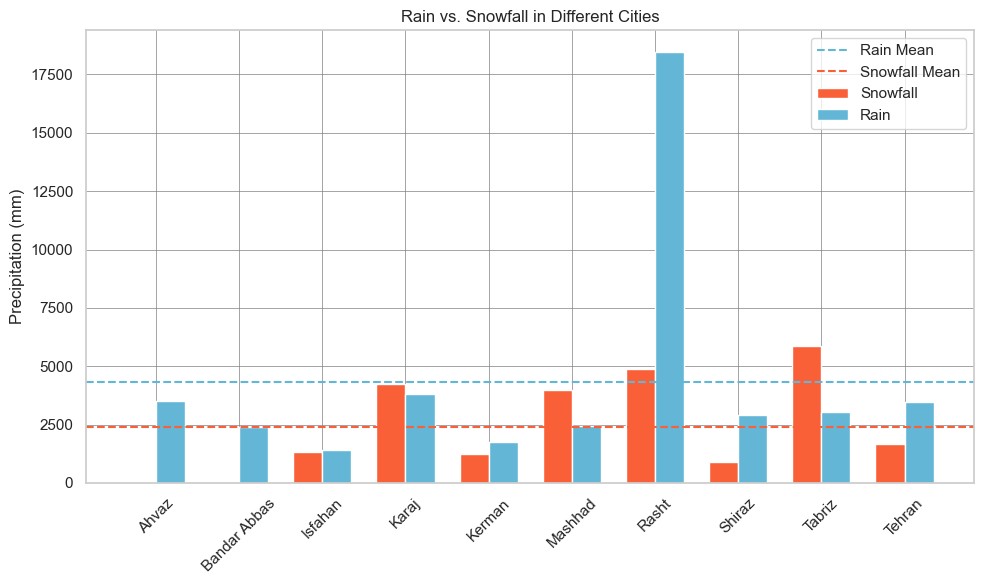

In [75]:
city_precip = df.groupby('city')[['rain_sum (mm)', 'snowfall_sum (mm)']].sum()
bar_width = 0.35
x = range(len(city_precip))
plt.figure(figsize=(10, 6))

plt.bar(x, city_precip['snowfall_sum (mm)'], width=bar_width, label='Snowfall', color='#f96038')
plt.bar([p + bar_width for p in x], city_precip['rain_sum (mm)'], width=bar_width, label='Rain', color='#63b6d5')

rainfall_mean = city_precip['rain_sum (mm)'].mean()
snowfall_mean = city_precip['snowfall_sum (mm)'].mean()

plt.axhline(y=rainfall_mean, color='#63b6d5', linestyle='--', label='Rain Mean')
plt.axhline(y=snowfall_mean, color='#f96038', linestyle='--', label='Snowfall Mean')

plt.title("Rain vs. Snowfall in Different Cities")
plt.ylabel("Precipitation (mm)")
plt.xlabel("")
plt.xticks([p + bar_width / 2 for p in x], city_precip.index)  # Center the tick labels
plt.legend()
plt.xticks(rotation=45)
plt.grid(True, color='gray', linewidth=0.5) 
plt.tight_layout()
plt.show()

del city_precip, bar_width, x, rainfall_mean, snowfall_mean

 **- تحلیل نمودار -**

این دفعه تحلیل نمودار میله‌ای بارش برف و باران تفاوت‌های منطقه‌ای مشخصی را میان شهرها نشان می‌دهد. رشت با بیشترین بارش کلی، ناشی از نزدیکی به دریای خزر و آب‌وهوای مرطوب خود پیشرو و برجسته است. نکته جالب بعدی این است که تبریز بیشترین میزان بارش برف را دارد، حتی بیشتر از رشت، که نشان‌دهنده زمستان‌های سردتر آن است. به طور کلی در سایر شهرها  بارش باران بیش از برف است، ولی در تبریز همچنان بارش برف بیشتر از باران است و میتوان گفت که این نشان‌دهنده ویژگی‌های خاص آب‌وهوایی تبریز محسوب میشود.

شهرهایی مانند اصفهان و کرمان بارش کمی دارند و میزان بارش آن‌ها کمتر از سطح میانگین ده شهر ایران است. تهران و شیراز در مجموع بارش خود طی دهه گذشته رفتار مشابهی داشته‌اند که نشان‌دهنده شباهت‌های بارش برف و باران آن‌هاست. جالب اینجاست که شهرهایی مانند اهواز و بندرعباس در نمودار میله‌ای هیچ بارش برفی اندازه‌گیری نشده یا موارد بسیار کم بوده لذا در نمودار به طور واضح قابل مشاهده نیست. البته این موضوع برای آب‌وهوای گرم آن‌ها معمول و منطقی است. در حالی که طبق تحلیل نمودار خطی قبلی بندرعباس در برخی سال‌ها شاهد افزایش‌های قابل توجهی در بارش باران بوده است، میزان مجموع کل بارش اهواز از بندرعباس بیشتر است که نشان می‌دهد اهواز الگوی ثابت‌تری از بارندگی را در طول سال‌ها تجربه کرده است درحالی که بندرعباس بارش کمی داشته و فقط طی یکسری سال ها صعود غیر معمول داشته (این رفتار احتمالا به دلیل نزدیکی به دریا و هوای مرطوب هست)

### تحلیل فصلی

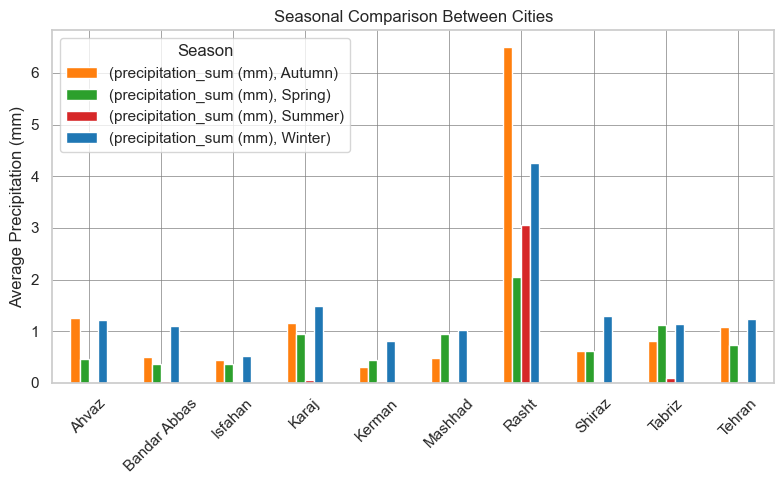

In [76]:
city_season_trends = df.groupby(['city', 'season']).agg({
    'precipitation_sum (mm)': 'mean',
}).unstack()
pallet = ['#ff7f0e', '#2ca02c', '#d62728', '#1f77b4']

ax = city_season_trends.plot(kind='bar', figsize=(8, 5), title="Seasonal Comparison Between Cities", color=pallet)
ax.set_xlabel("")
ax.set_ylabel("Average Precipitation (mm)")
ax.legend(title="Season")
plt.xticks(rotation=45)
plt.grid(True, color='gray', linewidth=0.5) 
plt.tight_layout()
plt.show()

del pallet, city_season_trends

 **- تحلیل نمودار -**
 
این بار تحلیل بارش فصلی را داریم که نشان می‌دهد که اکثر شهرها در تابستان بارندگی بسیار کمی دارند یا اصلاً بارندگی ندارند. با این حال، رشت با متوسط بارش قابل توجهی که تقریباً ۱ میلی‌متر بیشتر از بهار در تابستان است، متمایز می‌شود. در سایر فصول، رشت بیشترین متوسط بارش را در پاییز با ۶.۵ میلی‌متر نشان می‌دهد، در حالی که میانگین بارش در زمستان حدود ۴.۲ میلی‌متر است.

#### بررسی ساعات بارش

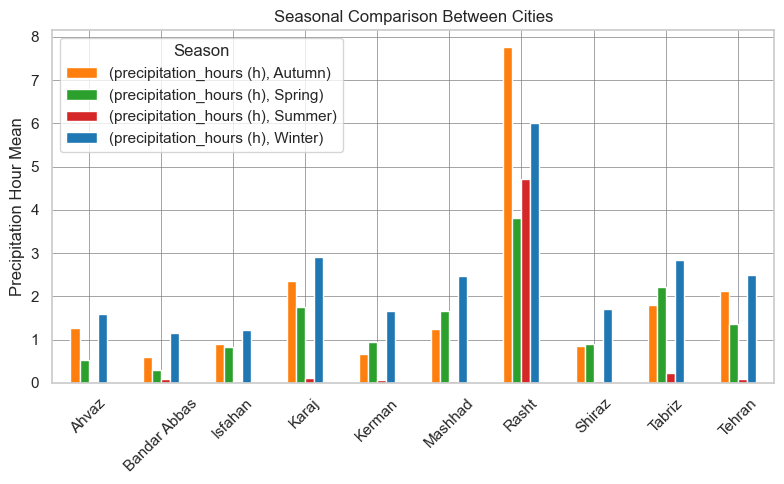

In [77]:
city_season_trends = df.groupby(['city', 'season']).agg({'precipitation_hours (h)': 'mean',}).unstack()
pallet = ['#ff7f0e', '#2ca02c', '#d62728', '#1f77b4']

ax = city_season_trends.plot(kind='bar', figsize=(8, 5), title="Seasonal Comparison Between Cities", color=pallet)
ax.set_xlabel("")
ax.set_ylabel("Precipitation Hour Mean")
ax.legend(title="Season")
plt.xticks(rotation=45)
plt.grid(True, color='gray', linewidth=0.5) 
plt.tight_layout()
plt.show()

del city_season_trends

 **- تحلیل نمودار -**

همونطور که در نمودارهای ساعات بارندگی نشان دیده میشود، تبریز، کرج، تهران و مشهد به طور متوسط حدود ۲.۵ ساعت بارندگی در زمستان دارند که نسبت به دیگر شهرها بیشتر است. رشت با میانگین حدود ۸ ساعت بارندگی در پاییز و ۶ ساعت در زمستان، بیشترین میزان ساعات بارش را دارد که به وضوح نشان‌دهنده بارندگی مداوم و طولانی این شهر، به‌ویژه در این فصول است

### بررسی همبستگی بارش

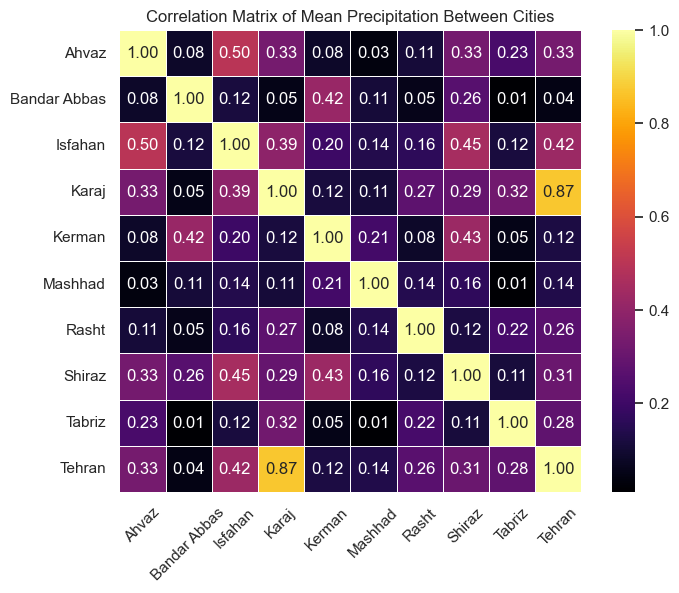

In [78]:
df_pivot = df.pivot_table(index='date', columns='city', values='precipitation_sum (mm)')
correlation_matrix = df_pivot.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="inferno", linewidths=0.5, square=True, fmt='.2f')
plt.title('Correlation Matrix of Mean Precipitation Between Cities')
plt.xticks(rotation=45)
plt.xlabel("")
plt.ylabel("")
plt.show()

del correlation_matrix, df_pivot

 **- تحلیل نمودار -**

همان‌طور که انتظار می‌رفت، ماتریس همبستگی بارش نشان می‌دهد که شهرهایی با اقلیم‌های مشابه تمایل به روابط مستقیم‌تری دارند. مقدار همبستگی با نزدیک شدن جغرافیایی شهرها افزایش می‌یابد. به طور خاص، کرج و تهران با همبستگی ۰.۸۷ بالاترین همبستگی را نشان می‌دهند، در حالی که تبریز و بندرعباس کمترین همبستگی، نزدیک به صفر را دارند. این الگو تأکید بر تأثیر نزدیکی جغرافیایی و شباهت‌های اقلیمی بر الگوهای بارش در شهرهای مختلف دارد

## تحلیل تبخیر مایعات

### نمودار خطی / زمانی

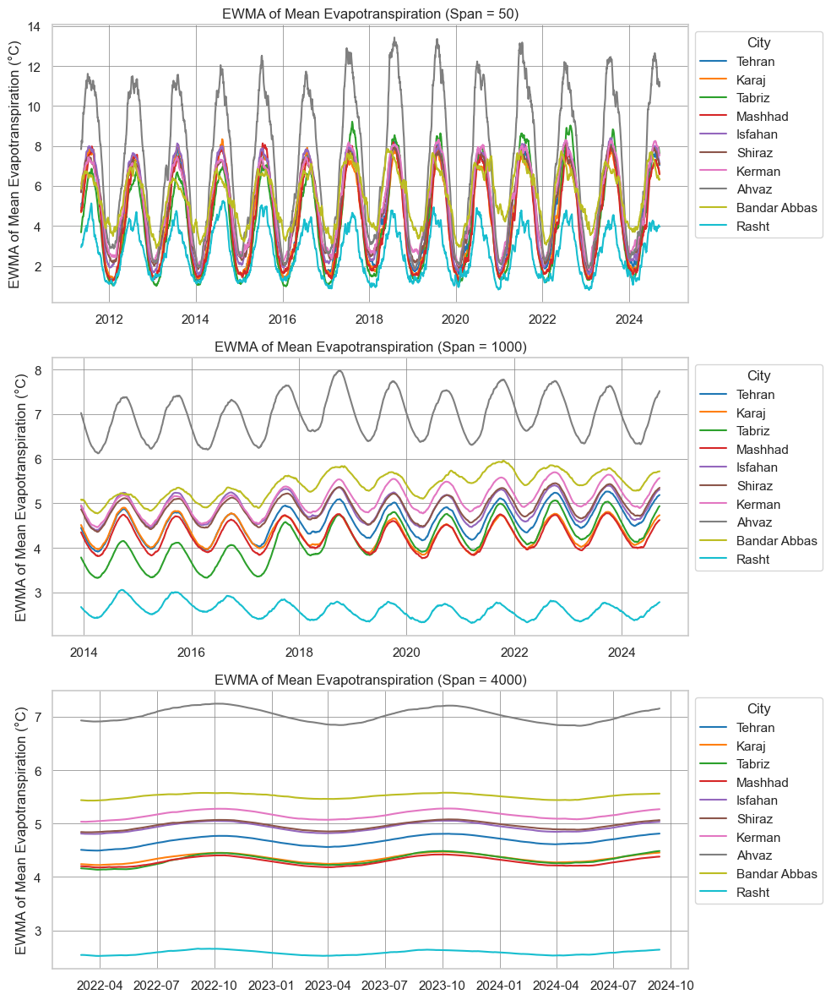

In [79]:
spans = [50, 1000, 4000]
pallet = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

fig, axs = plt.subplots(len(spans), 1, figsize=(10, 12))
cities = df['city'].unique()

for i, span in enumerate(spans):
    for j, city in enumerate(cities):
        city_data = df[df['city'] == city].set_index('date')
        ewma_evap = city_data['evapotranspiration (mm)'].ewm(span=span).mean()
        
        # Determine the starting point for plotting
        start_index = ewma_evap.index[span - 1]
        axs[i].plot(ewma_evap.index[span - 1:], ewma_evap[span - 1:], label=city, color=pallet[j % len(pallet)])

    axs[i].set_title(f"EWMA of Mean Evapotranspiration (Span = {spans[i]})")
    axs[i].set_ylabel("EWMA of Mean Evapotranspiration (°C)")
    axs[i].legend(title="City", bbox_to_anchor=(1, 1), loc='upper left')
    axs[i].grid(True, color='gray', linewidth=0.5) 

plt.tight_layout()
plt.show()

del spans, pallet, fig, axs, cities, city_data, ewma_evap

 **- تحلیل نمودار -**

نمودار خطی / سری زمانی تبخیر و تعریق نشان می‌دهد که بندرعباس و اهواز بالاترین نرخ‌های تبخیر را دارند، به طوری که بندرعباس کمترین تغییرپذیری را داشته، در حالی که اهواز بیشترین نوسانات و تغییرات را در بین تمام شهرها دارد. اکثر شهرها، از جمله بندرعباس و تبریز، در سال ۲۰۱۸ افزایش قابل توجهی در تبخیر و تعریق را نشان دادند که بعداً در سطح بالاتری تثبیت شد. این الگو با روندهای دما و تابش کوتاه‌مدت هم‌راستا است و نشان‌دهنده یک رابطه مستقیم کامل بین این ویژگی‌ها است، زیرا افزایش تابش خورشیدی و دما به طور مستقیم تبخیر و تعریق را تحریک می‌کند

 **- نتایج تحقیقات -**
 
افزایش تبخیر و تعریق در بندرعباس و سایر شهرها در سال ۲۰۱۸ احتمالاً ناشی از ترکیبی از عوامل است. اولاً، افزایش دما به علت تغییرات اقلیمی منطقه‌ای ممکن است به تابش خورشیدی بیشتری منجر شده باشد که به طور مستقیم تبخیر را تحریک می‌کند. ثانیاً، تغییرات در الگوهای بارش، مانند دوره‌های خشک طولانی‌تر و موج‌های گرمای شدیدتر، ممکن است تبخیر و تعریق را تشدید کرده باشد. این موضوع با تحقیقات موجود که نشان می‌دهد تغییرات اقلیمی در سال‌های اخیر به وقوع رویدادهای جوی شدیدتری از جمله موج‌های گرما و خشکسالی کمک کرده است، تأیید می‌شود. به طور خاص، قرارگیری طولانی‌مدت در دماهای بالا و کاهش بارش می‌تواند شرایطی را ایجاد کند که افزایش تبخیر و تعریق را تسهیل کند

### تحلیل شهری

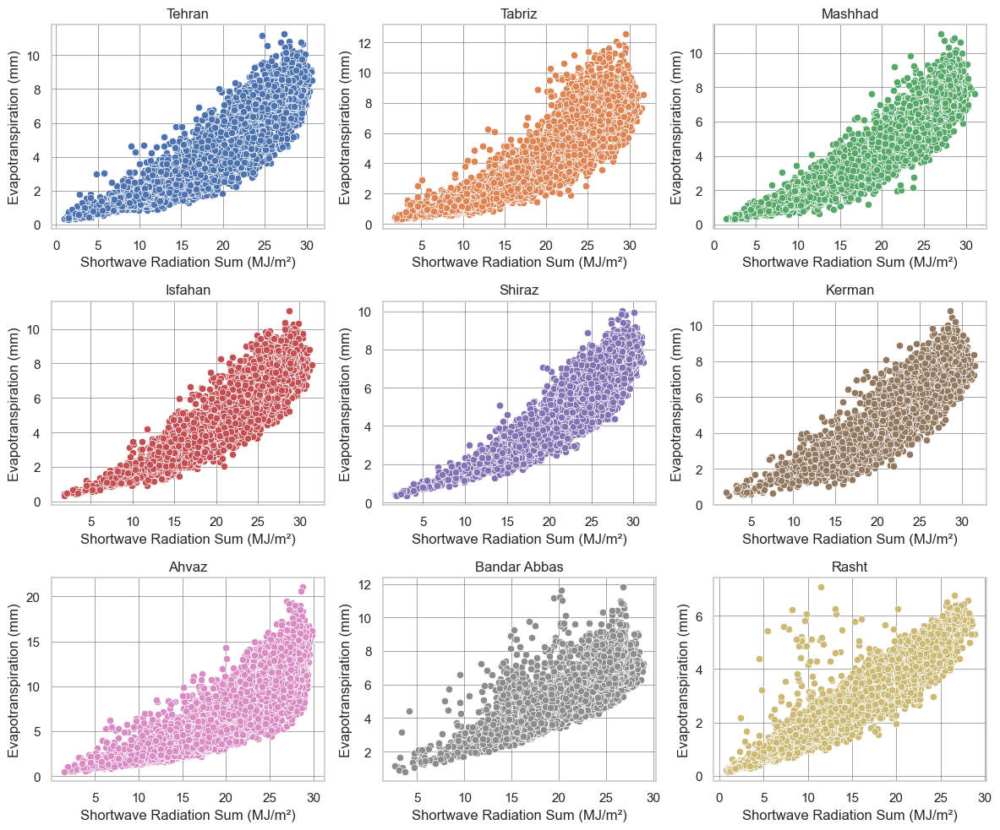

In [80]:
filtered_df = df[df['city'] != 'Karaj']
fig, axes = plt.subplots(3, 3, figsize=(12, 10))
axes = axes.flatten() 
cities = filtered_df['city'].unique()

for i, city in enumerate(cities):
    subset = filtered_df[filtered_df['city'] == city]
    sns.scatterplot(data=subset, x='shortwave_radiation_sum (MJ/m²)', y='evapotranspiration (mm)', ax=axes[i], color=sns.color_palette('deep')[i])
    axes[i].set_title(city)
    axes[i].set_xlabel('Shortwave Radiation Sum (MJ/m²)')
    axes[i].set_ylabel('Evapotranspiration (mm)')
    axes[i].grid(True, color='gray', linewidth=0.5) 

plt.tight_layout()
plt.show()

del filtered_df, fig, axes, cities, subset

### تحلیل فصلی

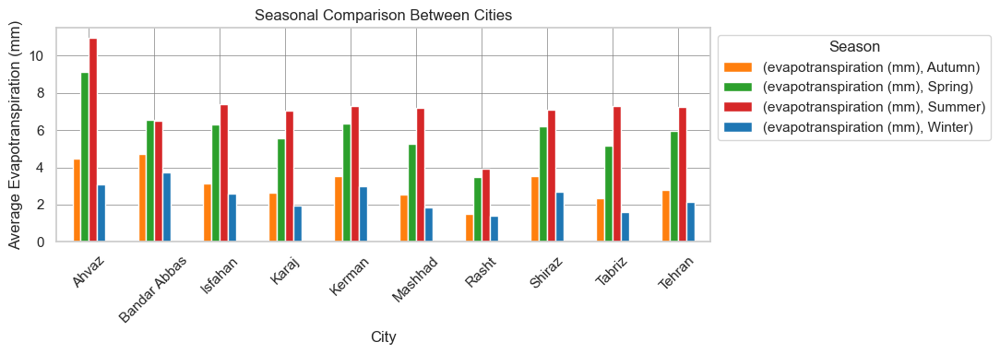

In [81]:
city_season_trends = df.groupby(['city', 'season']).agg({'evapotranspiration (mm)': 'mean',}).unstack()
pallet = ['#ff7f0e', '#2ca02c', '#d62728', '#1f77b4']

ax = city_season_trends.plot(kind='bar', figsize=(11, 4), title="Seasonal Comparison Between Cities", color=pallet)
ax.set_xlabel("City")
ax.set_ylabel("Average Evapotranspiration (mm)")
ax.legend(title="Season", bbox_to_anchor=(1, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(True, color='gray', linewidth=0.5) 
plt.tight_layout()
plt.show()

del city_season_trends

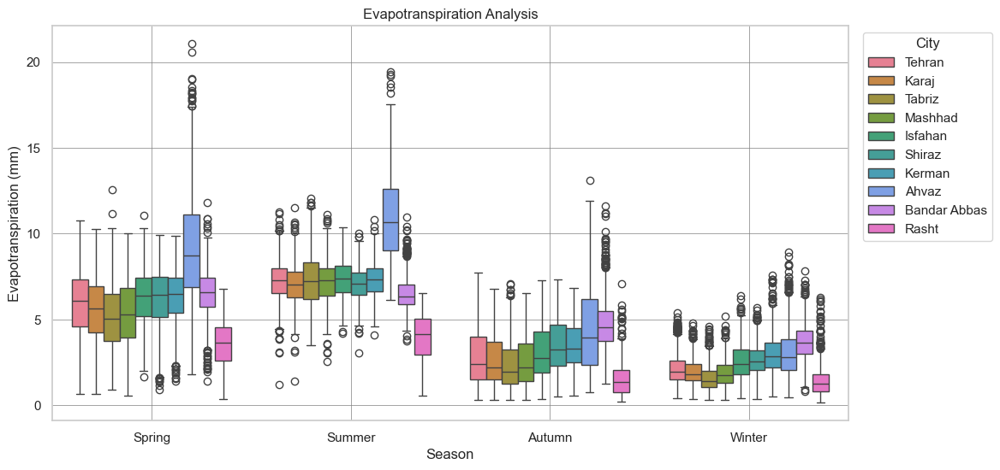

In [82]:
plt.figure(figsize=(12, 6))
sns.set_palette('rainbow')
sns.boxplot(x='season', y='evapotranspiration (mm)', hue='city', data=df)
plt.title("Evapotranspiration Analysis")
plt.ylabel("Evapotranspiration (mm)")
plt.xlabel("Season")
plt.legend(title='City', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 
plt.show()

 **- تحلیل نمودار -**

نمودار جعبه‌ای تبخیر و تعریق فصلی نشان می‌دهد که اهواز در بهار و تابستان بالاترین میزان تبخیر و تعریق را دارد، در حالی که بندرعباس در پاییز و زمستان پیشتاز است. رشت به طور مداوم کمترین میزان تبخیر و تعریق را در تمام فصول نشان می‌دهد که این موضوع بازتابی از اقلیم خنک‌تر و مرطوب‌تر آن نسبت به سایر شهرها است

### بررسی همبستگی تبخیر

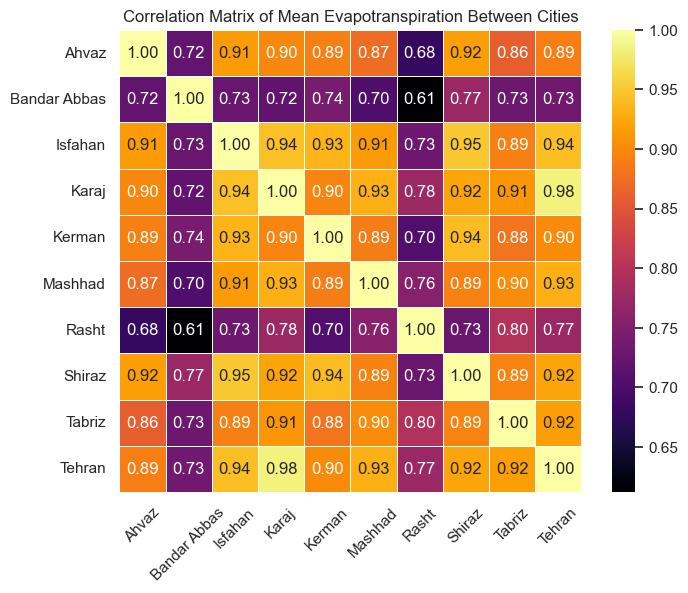

In [83]:
df_pivot = df.pivot_table(index='date', columns='city', values='evapotranspiration (mm)')
correlation_matrix = df_pivot.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="inferno", linewidths=0.5, square=True, fmt='.2f')
plt.title('Correlation Matrix of Mean Evapotranspiration Between Cities')
plt.xticks(rotation=45)
plt.xlabel("")
plt.ylabel("")
plt.show()

del correlation_matrix, df_pivot

 **- تحلیل نمودار -**

ماتریس همبستگی تبخیر و تعریق نشان می‌دهد که بیشتر شهرها روابط مستقیم قوی‌ای را از خود نشان می‌دهند، با مقادیر همبستگی بالای ۰.۸، و در شهرهای جغرافیایی نزدیک مانند تهران و کرج، این مقدار به ۱ نزدیک می‌شود. با این حال، بندرعباس و رشت همبستگی کمتری با سایر شهرها دارند، که به حدود ۰.۷ می‌رسد. این امر به دلیل نزدیکی آن‌ها به منابع آبی بزرگ، شامل خلیج فارس برای بندرعباس و دریای خزر برای رشت است. این تأثیرات ساحلی شرایط آب و هوایی متمایزی را ایجاد می‌کنند، از جمله سطوح رطوبت و تأثیرات دمایی متفاوت، که منجر به الگوهای منحصر به فرد تبخیر و تعریق می‌شود. همبستگی بین رشت و بندرعباس با وجود نزدیکی به دریا و شرایط شرجی و مرطوب مشابه پایین‌تر از بقیه شهر ها است و به ۰.۶ می‌رسد که نشان‌دهنده محیط‌های دریایی بنیادی متفاوت آن‌هاست

### اختلاف بارش و تبخیر سالانه

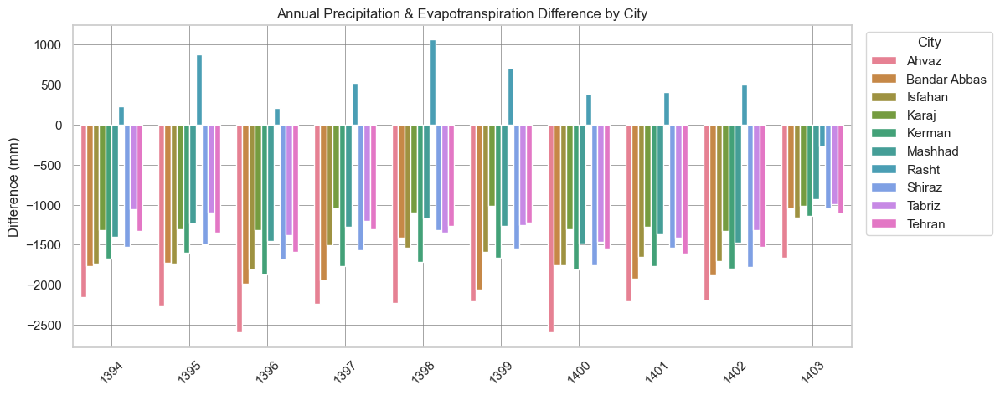

In [84]:
annual_diff = df.groupby(['year', 'city'])['remain_precipitation (mm)'].sum().reset_index()
annual_diff = annual_diff[annual_diff['year'] >= 1394]

plt.figure(figsize=(12, 5))
sns.set_palette('rainbow')
sns.barplot(data=annual_diff, x='year', y='remain_precipitation (mm)', hue='city')
plt.title("Annual Precipitation & Evapotranspiration Difference by City")
plt.xlabel("")
plt.ylabel("Difference (mm)")
plt.xticks(rotation=45)
plt.legend(title='City', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 
plt.show()

del annual_diff

 **- تحلیل نمودار -**

این نمودار میله‌ای به وضوح تفاوت‌های نگران‌کننده بین بارش و تبخیر/تعرق را در شهرهای مورد بررسی نشان می‌دهد. تنها شهری که تفاوت مثبتی از خود نشان می‌دهد، رشت است. رشت نقطه امیدی در میان واقعیت نگران‌کننده از دست رفتن آب در بقیه شهرها است. به طور مختصر، کرج و تبریز با از دست دادن حدود ۱۰۰۰ تا ۱۵۰۰ میلی‌متر آب در سال دست و پنجه نرم می‌کنند. در مقابل، شهرهایی مانند اهواز با چالش‌های شدیدتری روبرو هستند و از دست دادن آب در آن‌ها به حدود ۲۰۰۰ میلی‌متر در سال می‌رسد. در سال‌هایی مانند ۱۳۹۶ و ۱۴۰۰، اهواز حدود ۲۵۰۰ میلی‌متر آب از دست داد. این تفاوت‌ها نشان‌دهنده مسائل بحرانی مدیریت آب در مناطق مختلف هستند.

نکته مهم این است که علی‌رغم تفاوت منفی رشت در سال ۱۴۰۳، این موضوع توانایی این شهر برای داشتن تعادل مثبت آب در آینده را نفی نمی‌کند. تحلیل و نمودار های قبلی ما نشان می‌دهد که رشت معمولاً در پاییز شاهد سنگین‌ترین بارش‌ها و برف‌های خود است و دیتاست های فعلی ما هنوز این ماه‌های حیاتی برای سال ۱۴۰۳ را پوشش نداده است بنابراین هنوز امید زیادی به بارندگی در این شهر موجود است. رشت در سال‌های ۱۳۹۵، ۱۳۹۸ و ۱۳۹۹ میزان مثبت اختلاف آب بین ۵۰۰ تا ۱۰۰۰ میلی‌متر را ثبت کرد (منظور از اختلاف آب در واقع اختلاف بارش و تبخیر آب است) که نشان می‌دهد در آن دوره‌ها بارش‌ها به‌طور قابل‌توجهی بیشتر از میزان آب از دست‌رفته از طریق تبخیر و تعرق بوده است. این پایداری اهمیت ادامه نظارت و استراتژی‌های مدیریت آب پیشگیرانه برای کاهش اثرات تغییرات اقلیمی و تضمین منابع آب پایدار برای این جوامع را نشان می‌دهد.

## تحلیل سرعت باد و جهت وزش باد

### نمودار خطی / زمانی

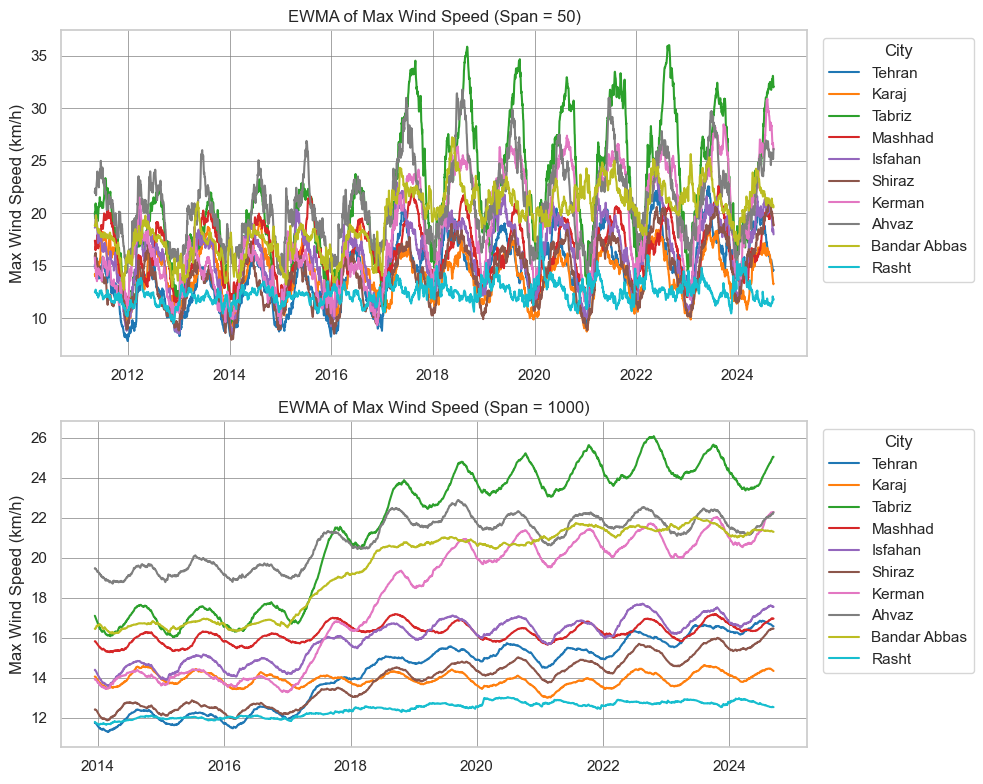

In [85]:
spans = [50, 1000]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

fig, axs = plt.subplots(len(spans), 1, figsize=(10, 8))

for i, span in enumerate(spans):
    for j, city in enumerate(df['city'].unique()):
        cities = df[df['city'] == city].set_index('date')
        ewma_wind_speed = cities['wind_speed_max (km/h)'].ewm(span=span).mean()
        start_index = ewma_wind_speed.index[span - 1]  # Adjust based on the span
        axs[i].plot(ewma_wind_speed.index[span - 1:], ewma_wind_speed[span - 1:], label=city, color=colors[j % len(colors)])

    axs[i].set_title(f"EWMA of Max Wind Speed (Span = {spans[i]})")
    axs[i].set_xlabel("")
    axs[i].set_ylabel("Max Wind Speed (km/h)")
    axs[i].legend(title='City', bbox_to_anchor=(1.01, 1), loc='upper left')
    axs[i].grid(True, color='gray', linewidth=0.5) 

plt.tight_layout()
plt.show()

 **- تحلیل نمودار -**

نمودار خطی زمانی سرعت باد الگوهای متمایزی را برای هر شهر نشان می‌دهد که نوسانات منحصر به فردی در سرعت باد را به نمایش می‌گذارد و در عین حال روندهای مشابهی در افزایش و کاهش سرعت باد در طول زمان دارد. به‌طور خاص، از سال ۲۰۱۷ تا ۲۰۱۸، افزایش ناگهانی در سرعت باد در تقریباً تمام شهرها مشاهده می‌شود، و پس از آن، شهرها به الگوهای پیشین خود در مقیاس‌های جدید ادامه می‌دهند. این روند نشان می‌دهد که در حالی که هر شهر تحت تأثیر عوامل اقلیمی خاص خود قرار دارد، عوامل خارجی ممکن است باعث تغییرات گسترده‌تری در الگوهای باد در این منطقه شده باشند

 **- نتایج تحقیقات -**

افزایش ناگهانی سرعت باد در شهرهای ایران در سال‌های ۲۰۱۷-۲۰۱۸ می‌تواند ناشی از ترکیبی از عوامل اقلیمی و محیطی باشد. یکی از توضیحات ممکن، تأثیر الگوهای تغییرات جوی، مانند تأثیر چرخه نوسان جنوبی ال نینو (ENSO) است که می‌تواند منجر به تغییرات در گردش جوی و افزایش فعالیت طوفانی در منطقه شود. علاوه بر این، شهرنشینی و تغییرات کاربری زمین، مانند جنگل‌زدایی و ساخت‌وساز، می‌توانند اثرات بادی محلی ایجاد کنند، مانند هدایت باد یا تلاطم باد. ترکیب این عوامل احتمالاً به افزایش مشاهده‌شده در سرعت باد منجر شده و تعاملات پیچیده بین فعالیت‌های انسانی و سیستم‌های طبیعی اقلیمی را برجسته می‌کند


### توزیع سرعت باد و وزش باد ناگهانی

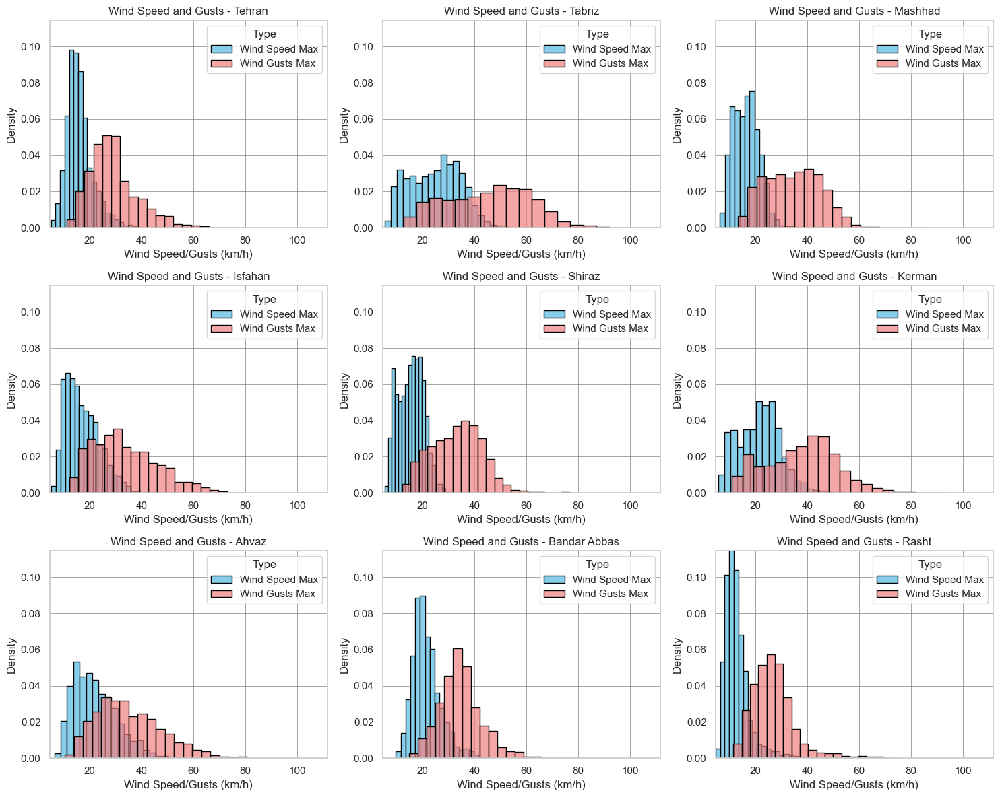

In [86]:
sns.set(style="whitegrid")

temp = df.copy()
temp = temp[temp['date'] >= "2018-01-01"]
cities = [city for city in temp['city'].unique() if city != 'Karaj']
plt.figure(figsize=(15, 12))

min_wind = temp['wind_speed_max (km/h)'].min()
max_wind = temp['wind_speed_max (km/h)'].max()
min_gust = temp['wind_gusts_max (km/h)'].min()
max_gust = temp['wind_gusts_max (km/h)'].max()

max_density = 0
for city in cities:
    city_data = temp[temp['city'] == city]
    wind_hist, _ = np.histogram(city_data['wind_speed_max (km/h)'], bins=20, density=True)
    gust_hist, _ = np.histogram(city_data['wind_gusts_max (km/h)'], bins=20, density=True)
    max_density = max(max_density, wind_hist.max(), gust_hist.max())

for i, city in enumerate(cities, 1):
    plt.subplot(3, 3, i)  # Adjust rows and columns as needed
    city_data = temp[temp['city'] == city]
    sns.histplot(city_data['wind_speed_max (km/h)'], bins=20, color='skyblue', edgecolor='black', label='Wind Speed Max', stat='density', alpha=1)
    sns.histplot(city_data['wind_gusts_max (km/h)'], bins=20, color='lightcoral', edgecolor='black', label='Wind Gusts Max', stat='density', alpha=0.7)

    plt.title(f'Wind Speed and Gusts - {city}')
    plt.xlabel('Wind Speed/Gusts (km/h)')
    plt.ylabel('Density')
    plt.legend(title='Type', loc='upper right')
    plt.grid(True, color='gray', linewidth=0.5) 
    plt.xlim((min(min_wind, min_gust), max(max_wind, max_gust)))
    plt.ylim(0, max_density)

plt.tight_layout()
plt.show()

del i, city, min_wind, max_wind, min_gust, max_gust, max_density, city_data, cities, temp

 **- مستندسازی -**

در تحلیل خود، تصمیم گرفتم بر روی داده‌های مربوط به سرعت باد از سال ۲۰۱۸ به بعد تمرکز کنم تا بررسی دقیق‌تر و نمایان‌تری از الگوهای مشاهده‌شده در شهرهای مختلف ارائه دهم. تغییرات قابل توجهی که در دینامیک‌ها و تغییرات سرعت باد در این بازه زمانی رخ داده، نشان‌دهنده تغییرات در شرایط جوی بود، که این امر تحلیل داده‌ها بعد از سال ۲۰۱۸ را برای کسب بینش‌های دقیق ضروری می‌سازد. با تمرکز بر این بازه زمانی، می‌توانم مقایسه‌های معناداری از توزیع‌های سرعت باد بین شهرهای مختلف انجام دهم و هرگونه روند یا تفاوت‌های قابل توجهی که پس از سال ۲۰۱۸ ظهور یافته‌اند را برجسته کنم. این رویکرد، اعتبار یافته‌ها را افزایش می‌دهد و درک روشنتری از تأثیرات اقلیمی در حال تحول بر الگوهای باد فراهم می‌آورد.

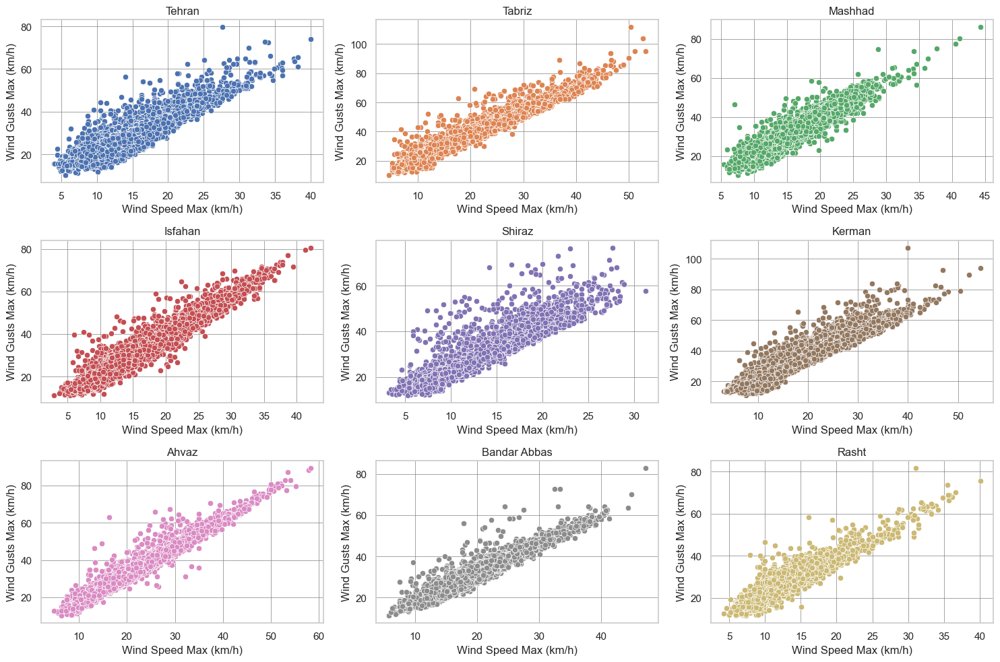

In [87]:
filtered_df = df[df['city'] != 'Karaj']
fig, axes = plt.subplots(3, 3, figsize=(15, 10))
axes = axes.flatten()  # Flatten the 2D array of axes
cities = filtered_df['city'].unique()

for i, city in enumerate(cities):
    subset = filtered_df[filtered_df['city'] == city]
    sns.scatterplot(data=subset, x='wind_speed_max (km/h)', y='wind_gusts_max (km/h)', ax=axes[i], color=sns.color_palette('deep')[i])
    axes[i].set_title(city)
    axes[i].set_xlabel('Wind Speed Max (km/h)')
    axes[i].set_ylabel('Wind Gusts Max (km/h)')
    axes[i].grid(True, color='gray', linewidth=0.5) 

plt.tight_layout()
plt.show()

del filtered_df, cities, subset, axes, city, i, fig

 **- تحلیل نمودار -**

در تحلیل سرعت باد و تندبادها (وزش ناگهانی باد)، تفاوت قابل توجهی در توزیع آن‌ها مشاهده شد، به‌طوری که تبریز گستره وسیع‌تری از تندبادها نسبت به دیگر شهرها نشان می‌دهد. نمودار پراکندگی متعاقباً این مشاهده را تقویت می‌کند و رابطه‌ای بسیار مستقیم بین سرعت باد و تندبادها را نشان می‌دهد. این همبستگی نشان می‌دهد که با افزایش سرعت باد، تندبادها نیز افزایش می‌یابند که این الگو در میان شهرهای مختلف یکسان است. با این حال، من نمودار خطی سری زمانی برای تندبادها را به‌طور جداگانه آزمایش کردم و الگوها بسیار نزدیک به روندهای سرعت باد بودند، اما برای ساده‌سازی ارائه و جلوگیری از تکرار، تصمیم گرفتم از نمایش جداگانه نمودار خطی (سری زمانی) برای تندبادها صرف‌نظر کنم. در عوض، این یافته را در تحلیل نمودار پراکندگی ادغام کردم

### نمودار جعبه‌ای فصلی

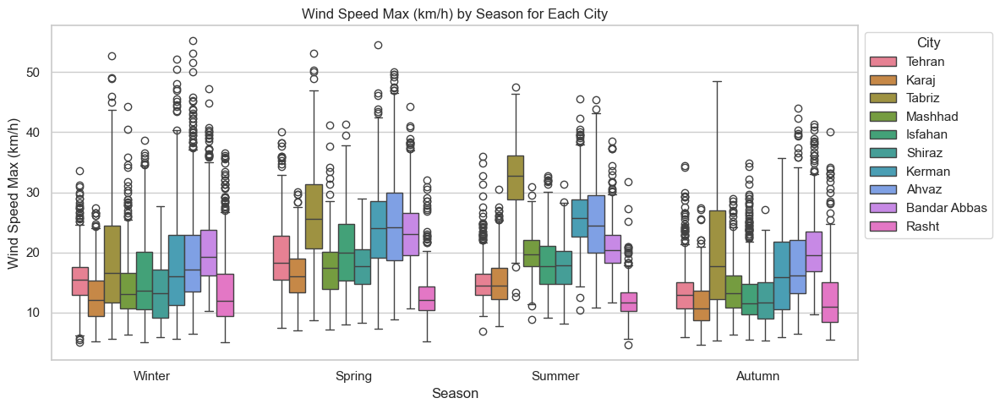

In [88]:
sns.set(style="whitegrid", palette="hsv")
temp = df.copy()
temp = temp[temp["date"] >= "2018-01-01"]
plt.figure(figsize=(12, 5))
sns.boxplot(x='season', y='wind_speed_max (km/h)', hue='city', data=temp)

plt.title('Wind Speed Max (km/h) by Season for Each City')
plt.xlabel('Season')
plt.ylabel('Wind Speed Max (km/h)')
plt.legend(title='City', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

del temp

 **- تحلیل نمودار -**

نمودار جعبه‌ای فصلی نشان می‌دهد که رشت به‌طور مداوم کمترین سرعت باد را در میان شهرهای مورد بررسی دارد، در حالی که تبریز بالاترین سرعت باد را در تمام فصول ثبت کرده است. جالب اینجاست که بندرعباس نیز با وجود نزدیکی به دریا، سرعت باد بالاتری نسبت به بسیاری از شهرهای دیگر دارد، که معمولاً انتظار می‌رود اقیانوس تأثیر باد را تعدیل کند. این پدیده ممکن است به ویژگی‌های جغرافیایی محلی و شرایط اقلیمی که جریان‌های باد را در بندرعباس افزایش می‌دهند مرتبط باشد، در مقابل رشت که دریای خزر ممکن است سرعت باد را در آن کاهش دهد. بنابراین، تفاوت‌های الگوهای باد در میان این شهرها، پیچیدگی تعامل عوامل جغرافیایی که بر شرایط آب‌وهوایی محلی تأثیر می‌گذارند را برجسته می‌کند

### همبستگی سرعت باد شهری

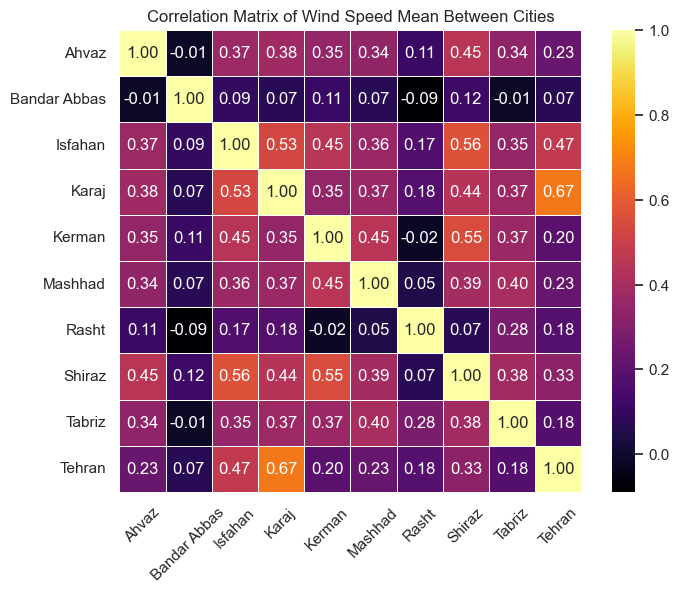

In [89]:
temp = df.copy()
temp = temp[temp["date"] >= "2018-01-01"]

pivot = temp.pivot_table(index='date', columns='city', values='wind_speed_max (km/h)')
correlation_matrix = pivot.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="inferno", linewidths=0.5, square=True, fmt='.2f')
plt.title('Correlation Matrix of Wind Speed Mean Between Cities')
plt.xticks(rotation=45)
plt.xlabel("")
plt.ylabel("")
plt.show()

del correlation_matrix, pivot, temp

 **- تحلیل نمودار -**

ماتریس همبستگی روابط بین شهرهای مختلف از نظر عوامل مرتبط با آب‌وهوا را نشان می‌دهد. به‌طور قابل توجه، تهران و کرج بالاترین همبستگی (۰.۶۷) را دارند که نشان‌دهنده الگوهای آب‌وهوایی مشابه است. اصفهان و کرج (۰.۵۳) و اصفهان و شیراز (۰.۵۶) نیز روابط قابل توجهی را نشان می‌دهند، که بیانگر شرایط اقلیمی مشابه این شهرها است. در مقابل، بندرعباس کمترین همبستگی‌ها را با دیگر شهرها نشان می‌دهد، که نشان‌دهنده ویژگی‌های اقلیمی خاص آن است، در حالی که رشت روابط ضعیف‌تری به‌طور کلی دارد، به‌ویژه با شهرهایی مانند اهواز (۰.۱۱) و بندرعباس (۰.۰۸-). این تحلیل تنوع دینامیک‌های آب‌وهوایی در میان شهرها را برجسته می‌کند که می‌تواند به عوامل جغرافیایی، اقلیم محلی، و تغییرات فصلی مرتبط باشد

### تحلیل جهت وزش باد

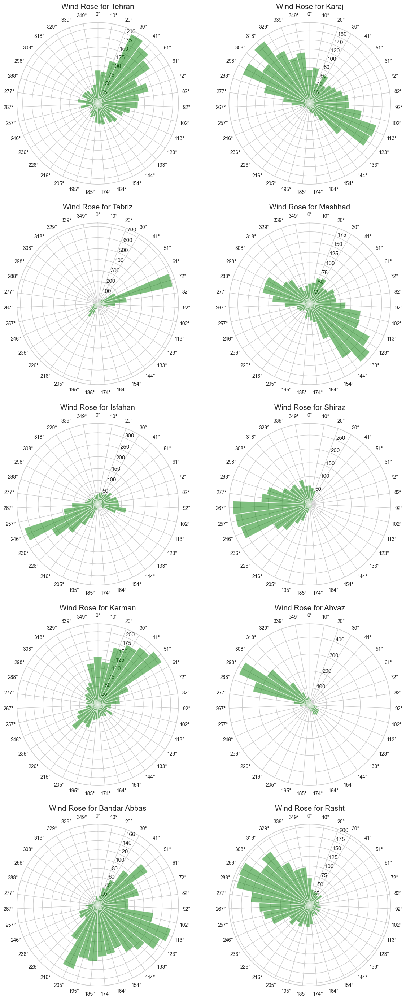

In [90]:
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(12, 28), subplot_kw=dict(polar=True))
axs = axs.flatten()
temp = df.copy()
temp = temp[temp['date'] >= "2018-01-01"]
cities = temp['city'].unique()
bins = np.linspace(0, 360, num=36)  # 10° bins

for ax, city in zip(axs, cities):
    city_data = temp[temp['city'] == city]
    hist, _ = np.histogram(city_data['wind_direction_dominant (°)'], bins=bins)
    angles = np.deg2rad(bins[:-1])  # Convert to radians
    width = np.deg2rad(10)  # Width of each bin
    
    ax.set_theta_zero_location('N')  # Set 0 degrees at the top
    ax.set_theta_direction(-1)  # Clockwise direction
    ax.bar(angles, hist, width=width, bottom=0.0, alpha=0.5, color='green')

    ax.set_xticks(angles)
    ax.set_xticklabels([f"{int(b)}°" for b in bins[:-1]], fontsize=10)
    ax.set_title(f'Wind Rose for {city}', fontsize=15)

plt.tight_layout(pad=1.5)  # Adjust layout to prevent overlap
plt.show()

del fig, axs, cities, city, ax, bins, city_data, hist, angles, width, 

 **- تحلیل نمودار -**
 
 نمودارهای **ویند-رز** از سال ۲۰۱۸ به بعد بینش‌های ارزشمندی درباره الگوهای باد در شهرهای مختلف ارائه می‌دهند. این نمودارها با نشان دادن فراوانی باد از جهت‌های مختلف، به ما کمک می‌کنند تا شرایط آب‌وهوایی محلی و تأثیرات احتمالی آن‌ها بر زندگی روزمره را بهتر درک کنیم. برای مثال، آگاهی از جهت‌های غالب باد می‌تواند به **برنامه‌ریزی شهری** کمک کند، مانند طراحی محل قرارگیری ساختمان‌ها برای بهینه‌سازی جریان هوا و کاهش گرما. در کشاورزی، کشاورزان می‌توانند از این اطلاعات برای انتخاب محصولاتی که تحت شرایط خاص باد بهتر رشد می‌کنند، استفاده کنند. همچنین، در صنایعی مانند **انرژی‌های تجدیدپذیر**، **هوانوردی** و **عملیات دریایی**، درک الگوهای باد برای اتخاذ تصمیم‌های آگاهانه در جهت افزایش ایمنی و کارایی ضروری است. به طور کلی، این نمودارها به عنوان ابزاری کاربردی برای ارزیابی تأثیر باد بر بخش‌های مختلف و افزایش آگاهی عمومی نسبت به شرایط آب‌وهوایی محلی عمل می‌کنند

علت استفاده از سال ۲۰۱۸ و بعد از آن، تغییرات اقلیمی هوایی بین‌شهری بود که در سال ۲۰۱۷ شروع شد و گاها هر دهه اتفاق می‌افتد. تحلیل کامل برای یافتن علل ممکن برای این تغییر در قسمت های قبل انجام شده لذا برای این قسمت اطلاعات سال ۲۰۱۸ به بعد را استفاده کردیم که نتایج دقیق‌تر و درست‌تری را برای تحلیل و به‌کارگیری ارائه می‌دهد.

## مدت زمان روشنایی روز

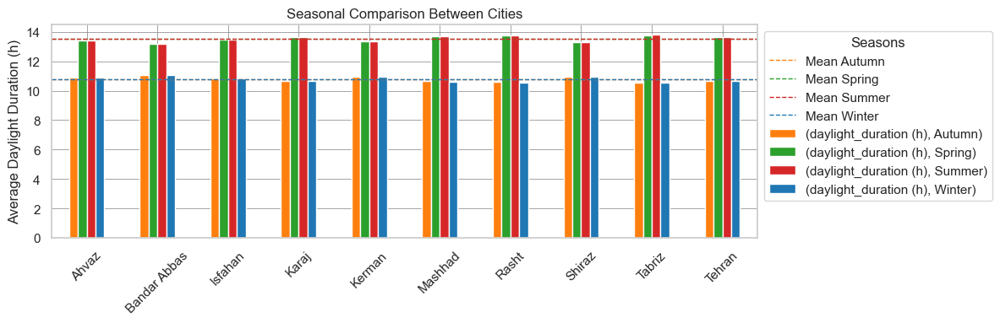

In [91]:
city_season_trends = df.groupby(['city', 'season']).agg({'daylight_duration (h)': 'mean'}).unstack()
pallet = ['#ff7f0e', '#2ca02c', '#d62728', '#1f77b4']
seasonal_means = df.groupby('season')['daylight_duration (h)'].mean().reset_index()
ax = city_season_trends.plot(kind='bar', figsize=(12, 4), title="Seasonal Comparison Between Cities", color=pallet)

for i, mean in enumerate(seasonal_means['daylight_duration (h)']):
    ax.axhline(y=mean, color=pallet[i], linestyle='--', linewidth=1, label=f'Mean {seasonal_means["season"].iloc[i]}')
    
ax.set_xlabel("")
ax.set_ylabel("Average Daylight Duration (h)")
plt.legend(title='Seasons', bbox_to_anchor=(1, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(True, color='gray', linewidth=0.5) 
plt.tight_layout()
plt.show()

del seasonal_means, i, mean, pallet, city_season_trends, ax

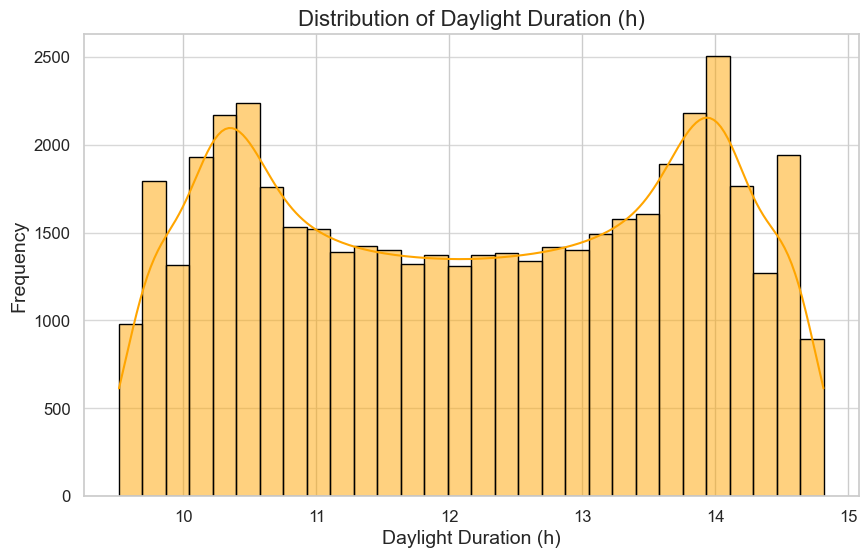

In [92]:
temp = df.copy()
temp = temp[(1390 <= temp['year']) & (temp['year'] < 1403)]
plt.figure(figsize=(10, 6))
sns.histplot(temp['daylight_duration (h)'], bins=30, color='orange', edgecolor='black', kde=True)
plt.title('Distribution of Daylight Duration (h)', fontsize=16)
plt.xlabel('Daylight Duration (h)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', alpha=0.75)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

del temp

 **- تحلیل نمودار -**
 
نمودار میله‌ای فصلی و هیستوگرام ساعت روشنایی روز نشان می‌دهند که میانگین مدت زمان روشنایی در طول روز در فصل‌های بهار و تابستان حدود ۱۳.۵ ساعت است، در حالی که در فصل‌های پاییز و زمستان به حدود ۱۰.۵ ساعت کاهش می‌یابد. این اطلاعات از جنبه‌های مختلف اهمیت بالایی دارد. طولانی‌تر بودن روزها در ماه‌های گرم‌تر باعث افزایش فعالیت‌های بیرونی، رونق گردشگری، و کاهش مصرف انرژی برای روشنایی و برق می‌شود. در مقابل، روزهای کوتاه‌تر در زمستان می‌تواند مصرف انرژی برای گرمایش و روشنایی را افزایش دهد. درک این الگوها به **کسب‌وکارها**، **برنامه‌ریزان شهری** و **کشاورزان** کمک می‌کند تا راهبردهای موثرتری برای مدیریت انرژی، تخصیص منابع و برنامه‌ریزی کشاورزی اتخاذ کنند، که در نهایت به **بهبود کیفیت زندگی ساکنین** منجر خواهد شد.

## تحلیل آثار تابش کوتاه‌موج خورشید و ارتفاع

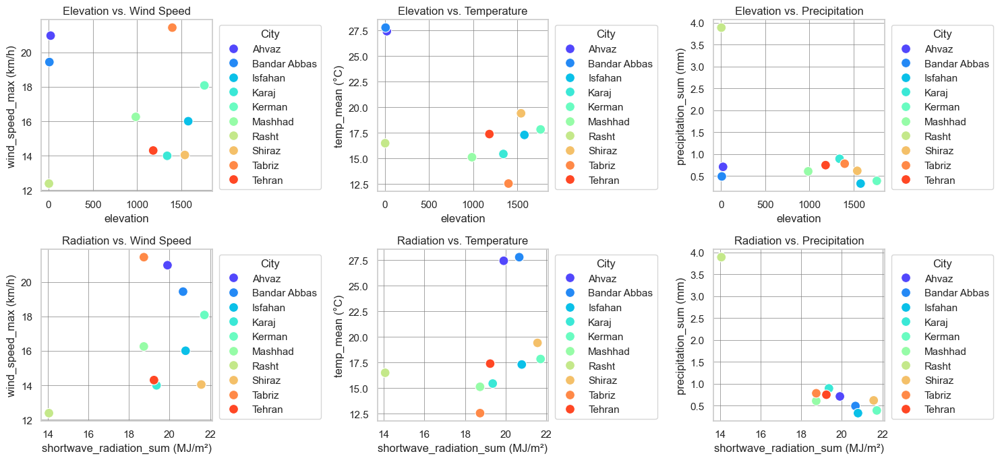

In [93]:
city_grouped = df.groupby('city').agg({
    'elevation': 'mean',
    'temp_mean (°C)': 'mean',
    'wind_speed_max (km/h)': 'mean',
    'precipitation_sum (mm)': 'mean',
    'shortwave_radiation_sum (MJ/m²)': 'mean'
}).reset_index()

scale = 100

# SCATTER PLOT
plt.figure(figsize=(15, 7))
rainbow_palette = sns.color_palette("rainbow", len(city_grouped['city'].unique()))

# Elevation vs Wind 
plt.subplot(2, 3, 1)
sns.scatterplot(x='elevation', y='wind_speed_max (km/h)', hue='city', data=city_grouped, 
                palette=rainbow_palette, s=scale) 
plt.title('Elevation vs. Wind Speed')
plt.legend(title='City', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 

# Elevation vs. Temperature
plt.subplot(2, 3, 2)
sns.scatterplot(x='elevation', y='temp_mean (°C)', hue='city', data=city_grouped, 
                palette=rainbow_palette, s=scale)
plt.title('Elevation vs. Temperature')
plt.legend(title='City', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 

# Radiation vs Precipitation
plt.subplot(2, 3, 3)
sns.scatterplot(x='elevation', y='precipitation_sum (mm)', hue='city', data=city_grouped, 
                palette=rainbow_palette, s=scale)
plt.title('Elevation vs. Precipitation')
plt.legend(title='City', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 

# Radiation vs Wind 
plt.subplot(2, 3, 4)
sns.scatterplot(x='shortwave_radiation_sum (MJ/m²)', y='wind_speed_max (km/h)', hue='city', data=city_grouped, 
                palette=rainbow_palette, s=scale) 
plt.title('Radiation vs. Wind Speed')
plt.legend(title='City', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 

# Radiation vs. Temperature
plt.subplot(2, 3, 5)
sns.scatterplot(x='shortwave_radiation_sum (MJ/m²)', y='temp_mean (°C)', hue='city', data=city_grouped, 
                palette=rainbow_palette, s=scale)
plt.title('Radiation vs. Temperature')
plt.legend(title='City', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 

# Radiation vs Precipitation
plt.subplot(2, 3, 6)
sns.scatterplot(x='shortwave_radiation_sum (MJ/m²)', y='precipitation_sum (mm)', hue='city', data=city_grouped, 
                palette=rainbow_palette, s=scale)
plt.title('Radiation vs. Precipitation')
plt.legend(title='City', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.grid(True, color='gray', linewidth=0.5) 

plt.tight_layout()
plt.show()

del scale, city_grouped

#### **تأثیر ارتفاع بر متغیرهای آب و هوایی**

1. **سرعت باد**:  
همبستگی مثبتی بین ارتفاع و سرعت باد مشاهده می‌شود، به‌ویژه در تبریز که ارتفاع بالاتر با افزایش سرعت باد همراه است. با این حال، استثناهایی مانند رشت به علت هوای شرجی و مرطوب خود نشان می‌دهند که عوامل جغرافیایی محلی می‌توانند تأثیر قابل توجهی بر الگوهای باد داشته باشند و این نشان می‌دهد که رفتار باد تنها توسط ارتفاع تعیین نمی‌شود.
‎ 
2. **دما**:  
روند مورد انتظار کاهش دما با افزایش ارتفاع در داده‌ها تأیید می‌شود. شهرهایی با ارتفاع کمتر، مانند اهواز، دمای بالاتری دارند، در حالی که شهرهایی با ارتفاع بیشتر مانند اصفهان و کرمان دمای متوسط کمتری نشان می‌دهند. دمای متوسط مشاهده شده در رشت نشان می‌دهد که تأثیرات اقلیمی دیگر می‌توانند این رابطه را پیچیده کنند. لذا میتوان نتیجه گرفت که دما و ارتفاع با اینکه انتظار میرود با هم رابطه عگس داشته باشند ولی عوامل مختلف مثل میزان تابش خورشید در شهر های مرکز ایران میتوانند عواملی باشند که برعکس انتظار ما را نمایان میکنند. ولی بصورت تئوری با حذف عامل نور بخصوص در تحلیل قسمت بعد میتوان نتیجه گرفت که این دو متغیر رابطه عکس دارند.
‎ 
3. **بارش**:  
تحلیل بارش در رابطه با ارتفاع تعامل پیچیده‌تری را نشان می‌دهد. در حالی که ارتفاعات بالاتر معمولاً با افزایش بارش به دلیل پدیده **لیفت اوروگرافی (بالایی در علم کوه شناسی)** همبستگی دارند، بارش قابل توجه رشت با وجود ارتفاع پایینش، اهمیت شرایط اقلیمی محلی را برجسته می‌کند. از سوی دیگر، شهرهایی مانند تبریز و اصفهان سطوح بارش کمتری دارند که نشان می‌دهد ویژگی‌های اقلیمی منطقه‌ای می‌توانند بر اثرات ارتفاع غلبه کنند.

#### **تأثیر تابش موج کوتاه خورشید بر متغیرهای آب و هوایی**

1. **سرعت باد**:  
رابطه بین تابش موج کوتاه و سرعت باد نشان‌دهنده یک همبستگی مثبت بالقوه است، به طوری که سطوح بالاتر تابش خورشیدی به افزایش فعالیت باد منجر می‌شود. این رابطه نقش خورشید در گرم کردن مولکول های هوا و حرکت‌های جوی را تأیید می‌کند.
‎ 
2. **دما**:  
همان‌طور که انتظار می‌رفت، همبستگی مثبت قوی بین تابش موج کوتاه و دما مشاهده می‌شود. سطوح بالاتر تابش موج کوتاه با دماهای گرم‌تر همراه است، که نشان می‌دهد انرژی بیشتر خورشیدی منجر به افزایش جذب حرارت در جو می‌شود. به طور کلی با نتیجه این نمودار و تحلیل قبلی میتوان دید علی رقم ظریب همبستگی منفی بین ارتفاع و دما از لحاظ تئوری، تأثیر تابش موج کوتاه خورشید از ارتفاع بر دما بیشتر است.
‎ 
3. **بارش**:  
تحلیل بارش در رابطه با تابش موج کوتاه یک رابطه پیچیده را نشان می‌دهد. در حالی که تابش موج کوتاه بالاتر می‌تواند نشانه‌ای از آسمان صاف و کاهش بارش باشد، عوامل دیگری مانند رطوبت و جغرافیای محلی نیز نقش‌های مهمی در تعیین الگوهای بارش دارند. این پیچیدگی نیاز به یک رویکرد چندوجهی برای درک کامل تعاملات مؤثر بر بارش دارد.

## همبستگی شاخصه‌های آب و‌هوایی

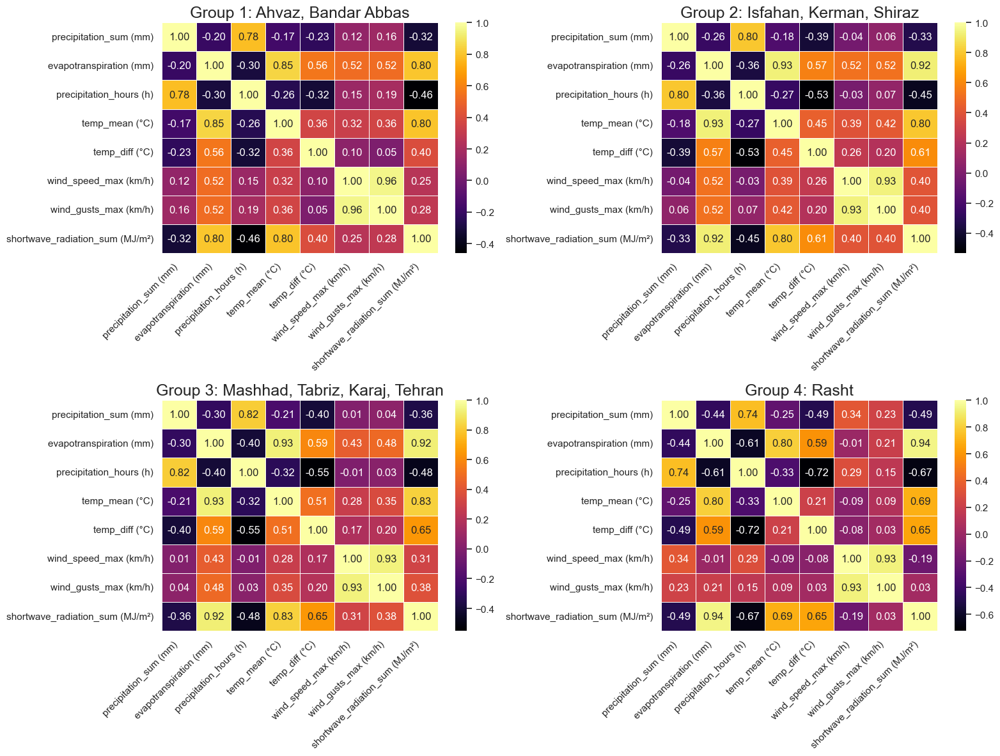

In [94]:
group1 = ['Ahvaz', 'Bandar Abbas']
group2 = ['Isfahan', 'Kerman', 'Shiraz']
group3 = ['Mashhad', 'Tabriz', 'Karaj', 'Tehran']
group4 = ['Rasht']

all_cities = [group1, group2, group3, group4]

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()  # Flatten the axes array for easy indexing
features = ['precipitation_sum (mm)',
            'evapotranspiration (mm)',
            'precipitation_hours (h)',
            'temp_mean (°C)',
            'temp_diff (°C)',
            'wind_speed_max (km/h)',
            'wind_gusts_max (km/h)', 
            'shortwave_radiation_sum (MJ/m²)']

for i, cities in enumerate(all_cities):
    df_filtered = df[df['date'] >= '2018-01-01']
    city_data = df_filtered[df_filtered['city'].isin(cities)]
    corr_matrix = city_data[features].corr()
    sns.heatmap(corr_matrix, annot=True, cmap='inferno', ax=axes[i], fmt='.2f', linewidths=0.5)
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45, ha='right')
    axes[i].set_title(f"Group {i+1}: {', '.join(cities)}", fontsize=18)

plt.tight_layout()
plt.show()


#### Corrlation Matrix Analysis :

##### **گروه ۱ - اهواز و بندرعباس**

- **بارش** همبستگی متوسطی با **ساعات بارش** دارد (۰.۷۸)، که نشان‌دهنده وقوع رویدادهای طولانی‌تر بارش در این مناطق است
‎
- همبستگی ضعیف منفی بین **بارش** و **تبخیر و تعرق** (-۰.۲۰) نشان می‌دهد که در شرایط مرطوب‌تر، از دست دادن رطوبت تا حدی کاهش می‌یابد
‎
- **تبخیر و تعرق** دارای همبستگی مثبت قوی با **میانگین دما** (۰.۸۵) و **تابش موج کوتاه** (۰.۸۰) است، که تأثیر دمای بالا و تابش خورشیدی شدید را بر از دست دادن آب برجسته می‌کند
‎
- **سرعت باد** و **تندباد (وزش ناگهانی باد)** همبستگی مثبت متوسطی با **تبخیر و تعرق** دارند، که نشان می‌دهد باد نقشی در افزایش از دست دادن رطوبت ایفا می‌کند

گروه ۱ الگوهای اقلیم خشک را منعکس می‌کند، جایی که دمای بالا، تابش خورشیدی شدید و باد تأثیر قابل‌توجهی بر **تبخیر و تعرق** دارند، در حالی که **بارش** تا حد زیادی مستقل از تأثیرات دما است

##### **گروه ۲ - اصفهان، کرمان و شیراز**

- **بارش** با **ساعات بارش** همبستگی دارد (۰.۸۰)، مشابه گروه ۱، اما با همبستگی منفی قوی‌تری با **تبخیر و تعرق** (-۰.۲۶)، که نشان می‌دهد باران به‌طور مؤثری تبخیر را محدود می‌کند
‎
- **تبخیر و تعرق** همبستگی قوی با **میانگین دما** (۰.۹۳) و **تابش موج کوتاه** (۰.۹۲) دارد، که نقش حیاتی دمای بالا و تابش خورشیدی در از دست دادن رطوبت را تأیید می‌کند
‎
- همبستگی متوسطی بین **تفاوت دما** و **تبخیر و تعرق** (۰.۵۷) و همچنین بین **سرعت باد** و **تبخیر و تعرق** (۰.۵۲) وجود دارد که نشان می‌دهد نوسانات دمای روزانه و باد در افزایش تبخیر نقش دارند

اقلیم گروه ۲ با تأثیرات متوسط بارش و وابستگی بیشتر به **دما**، **تابش خورشیدی** و **باد** در پویایی رطوبت مشخص می‌شود

##### **گروه ۳ - مشهد، تبریز، کرج و تهران**

- **بارش** همبستگی قوی با **ساعات بارش** دارد (۰.۸۲)، در حالی که **تبخیر و تعرق** با **بارش** همبستگی منفی متوسطی دارد (-۰.۳۰)، که نشان می‌دهد دوره‌های بارانی به‌طور مؤثری تبخیر را سرکوب کرده و کاهش می‌دهند
‎
- **تبخیر و تعرق** همبستگی قوی با **میانگین دما** (۰.۹۳) و **تابش موج کوتاه** (۰.۹۲) دارد، که تأکید بر دما و انرژی خورشیدی به عنوان عوامل اصلی از دست دادن رطوبت دارد
‎
- **سرعت باد** همبستگی کمی قوی‌تر با **تبخیر و تعرق** دارد (۰.۴۳)، که نشان می‌دهد اثرات باد در این شهرها نسبت به گروه‌های قبلی بیشتر است

شهرهای گروه ۳ دارای اقلیم نیمه‌خشک تا معتدل هستند، و **دما**، **تابش خورشیدی** و **باد** نقش‌های مهمی در تعیین پویایی رطوبت ایفا می‌کنند

##### **گروه ۴ - رشت**

- **بارش** همبستگی مثبت متوسطی با **ساعات بارش** دارد (۰.۷۴)، و همبستگی منفی قوی‌تری با **تبخیر و تعرق** (-۰.۴۴)، که نشان می‌دهد بارش به‌طور قابل توجهی نرخ تبخیر و تعرق را کاهش می‌دهد
‎
- همبستگی بین **تبخیر/تعرق** و **میانگین دما** نسبت به سایر گروه‌ها کمی ضعیف‌تر است (۰.۸۰)، که نشان می‌دهد دما به‌عنوان عامل اصلی در تغییرات تبخیر در رشت کمتر تأثیرگذار است
‎
- همبستگی قوی بین **تبخیر/ تعرق** و **تابش موج کوتاه** وجود دارد (۰.۹۱)، که نشان می‌دهد انرژی خورشیدی یک عامل کلیدی در از دست دادن رطوبت است، به‌ویژه در دوره‌های بدون باران
‎
- **سرعت باد** تقریباً هیچ رابطه‌ای با **تبخیر/تعرق** ندارد (-۰.۰۱)، که نشان می‌دهد باد نقش کمی در تغییرات و تاثیر رطوبت در اینجا ایفا می‌کند. این موضوع با اقلیم ساحلی رشت همخوانی دارد، جایی که **رطوبت** و **بارش** بیشتر از باد بر الگوهای رطوبت غالب هستند.

اقلیم ساحلی رشت با بارش و رطوبت بالا که چرخه رطوبت را کنترل می‌کند، مشخص می‌شود. **تابش خورشیدی** نقش قابل توجهی در **تبخیر و تعرق** دارد، به‌ویژه زمانی که رخ می‌دهد، اما **باد** تأثیر کمی بر نرخ تبخیر دارد.

## مروری بر تحلیل ها تا اینجا

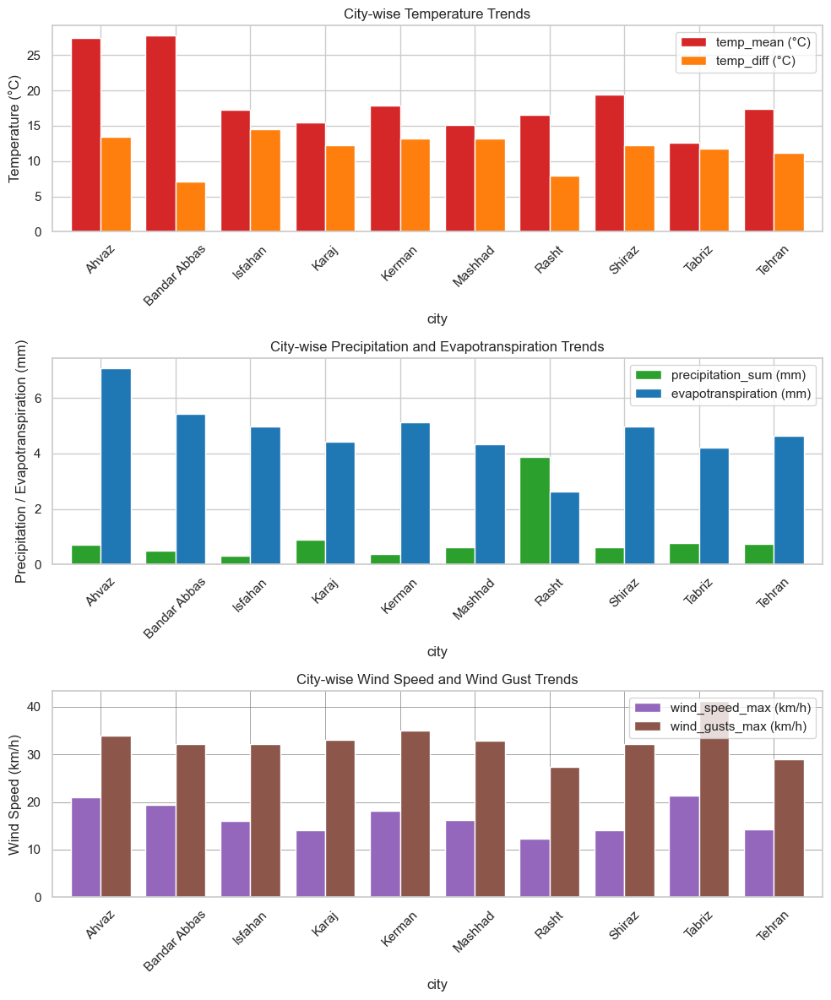

In [95]:
city_trends = df.groupby('city').agg({
    'temp_mean (°C)': 'mean',
    'temp_diff (°C)': 'mean',
    'precipitation_sum (mm)': 'mean',
    'evapotranspiration (mm)': 'mean',
    'wind_speed_max (km/h)': 'mean',
    'wind_gusts_max (km/h)': 'mean'
})
fig, axes = plt.subplots(3, 1, figsize=(10, 12))

colors_temp = ['#d62728', '#ff7f0e']  # Blue and orange for temperature
colors_precip = ['#2ca02c', '#1f77b4']  # Green and red for precipitation/evapotranspiration
colors_wind = ['#9467bd', '#8c564b']  # Purple and brown for wind speed and gusts

city_trends[['temp_mean (°C)', 'temp_diff (°C)']].plot(
    kind='bar', ax=axes[0], width=0.8, color=colors_temp)
axes[0].set_title("City-wise Temperature Trends")
axes[0].set_ylabel("Temperature (°C)")
axes[0].set_xticklabels(city_trends.index, rotation=45)

city_trends[['precipitation_sum (mm)', 'evapotranspiration (mm)']].plot(
    kind='bar', ax=axes[1], width=0.8, color=colors_precip)
axes[1].set_title("City-wise Precipitation and Evapotranspiration Trends")
axes[1].set_ylabel("Precipitation / Evapotranspiration (mm)")
axes[1].set_xticklabels(city_trends.index, rotation=45)

city_trends[['wind_speed_max (km/h)', 'wind_gusts_max (km/h)']].plot(
    kind='bar', ax=axes[2], width=0.8, color=colors_wind)
axes[2].set_title("City-wise Wind Speed and Wind Gust Trends")
axes[2].set_ylabel("Wind Speed (km/h)")
axes[2].set_xticklabels(city_trends.index, rotation=45)

plt.grid(True, color='gray', linewidth=0.5) 
plt.tight_layout()
plt.show()

del city_trends

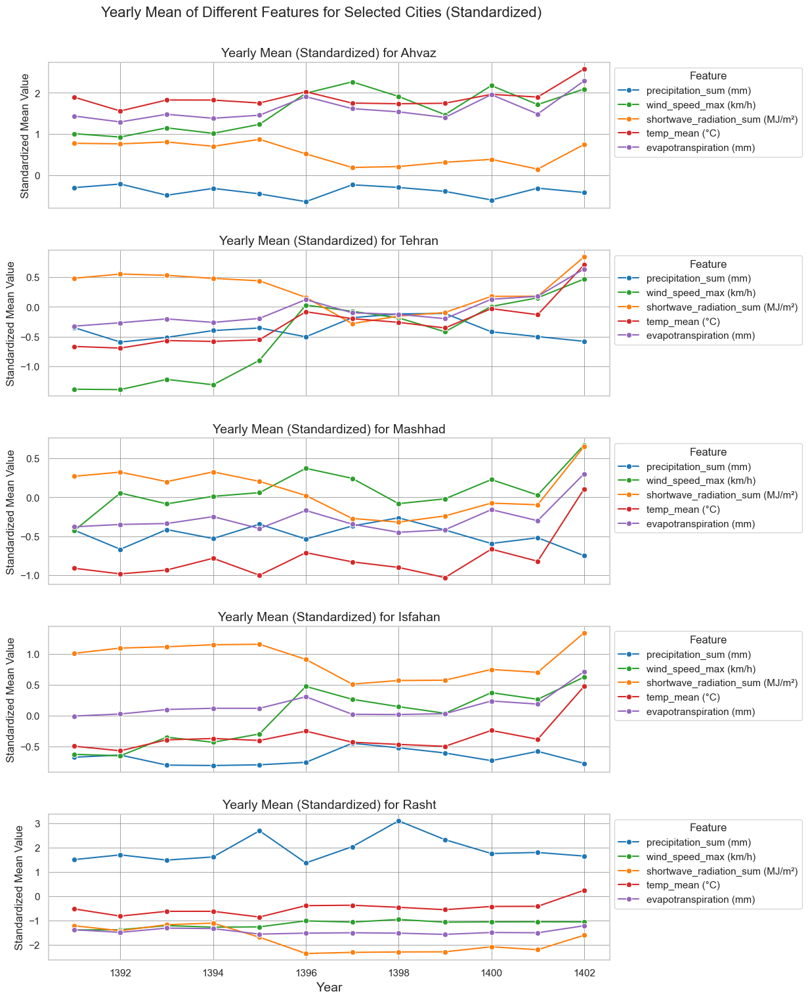

In [96]:
temp = df.copy()
temp = temp[(temp["date"] > "2012-03-21") & ("2024-01-01" > temp["date"])]
selected_cities = ["Ahvaz", "Tehran", "Mashhad", "Isfahan", "Rasht"]
temp = temp[temp['city'].isin(selected_cities)]
features = ["precipitation_sum (mm)", "wind_speed_max (km/h)", 
            "shortwave_radiation_sum (MJ/m²)", "temp_mean (°C)", "evapotranspiration (mm)"]
annual_mean = temp.groupby(['year', 'city'])[features].mean().reset_index()
annual_mean = annual_mean.sort_values(by=['year', 'city'])

scaler = StandardScaler()
scaled_features = scaler.fit_transform(annual_mean[features])
scaled_df = pd.DataFrame(scaled_features, columns=features)
annual_mean_scaled = pd.concat([annual_mean[['year', 'city']], scaled_df], axis=1)

pallet = ['#1f77b4', '#2ca02c', '#ff7f0e', '#d62728', '#9467bd']

fig, axes = plt.subplots(5, 1, figsize=(10, 15), sharex=True)
fig.tight_layout(pad=3.0)

for i, city in enumerate(selected_cities):
    ax = axes[i]
    city_data = annual_mean_scaled[annual_mean_scaled['city'] == city]
    
    for j, feature in enumerate(features):
        sns.lineplot(data=city_data, x='year', y=feature, marker='o', ax=ax, label=feature, color=pallet[j])

    ax.set_title(f'Yearly Mean (Standardized) for {city}', fontsize=14)
    ax.set_ylabel('Standardized Mean Value', fontsize=12)
    ax.grid(True, color='gray', linewidth=0.5)
    ax.legend(title="Feature", bbox_to_anchor=(1, 1), loc='upper left')

axes[-1].set_xlabel("Year", fontsize=14)
plt.suptitle('Yearly Mean of Different Features for Selected Cities (Standardized)', fontsize=16, y=1.02)
plt.show()

del temp, annual_mean, annual_mean_scaled, scaled_features, scaled_df, selected_cities, features, i, city, city_data, pallet


**- مستندسازی -**

اهواز، مشهد، اصفهان و رشت به‌عنوان رهبران تحلیل اقلیمی انتخاب شدند. در حالی که تهران در ابتدا قرار بود در گروه مشهد قرار گیرد، من تصمیم گرفتم تهران را به‌صورت جداگانه بررسی کنم تا تفاوت‌های احتمالی ناشی از جمعیت بیشتر و عوامل دیگر را مورد بررسی قرار دهم.

# **نتیجه‌گیری**

در این تحلیل از متغیرهای آب و هوایی شهرهای مختلف ایران، با یکدیگر مرحله به مرحله به بینش‌های جذابی دست یافتیم که روابط پیچیده بین دما، بارش، ارتفاع، و عوامل اقلیمی محلی را نشان می‌دهد. در این بخش مروری بر یافته‌های اصلی و نتایج آن‌ها خواهیم داشت:

#### 1. **تغییرات دمایی و بارشی:**
   - در طول دهه گذشته، شاهد یک روند گرم شدن قابل توجه بودیم، به ویژه در شهرهایی مانند اهواز و بندرعباس که دما افزایش شدیدی داشته است. از سوی دیگر، شهرهایی با ارتفاع بالاتر مانند تبریز، دماهای پایین‌تری را تجربه کردند که تأیید کننده انتظارات ما در رابطه با تأثیر ارتفاع بر دما است. با این حال، الگوهای بارش کمتر قابل پیش‌بینی هستند. برای مثال، رشت با بارش قابل توجه خود به دلیل ویژگی‌های منحصربه‌فرد اقلیم ساحلی خود متمایز است. این تغییرپذیری نشان می‌دهد که هنگام تحلیل داده‌های آب و هوایی باید عوامل محلی را در نظر گرفت.  همچنین مشاهده کردیم که دمای تمامی شهر های بررسی شده بشدت به یکدیگر وابسته بود و با میزان تابش کوتاه موج خورشید و وزش باد رابطه مستقیمی را تجربه کردند که سبب پدیدار شدن این الگوی پایدار و رفتار فصلی به فصل مشابه بین شهری شد.
   ‎

#### 2. **تأثیر ارتفاع:**
   - یافته‌های ما نشان می‌دهد که به‌طور کلی، با افزایش ارتفاع، دما کاهش می‌یابد. شهرهایی مانند اصفهان و کرمان از این روند پشتیبانی می‌کنند و به دلیل ارتفاع بالاتر خود دماهای خنک‌تری را تجربه می‌کنند. البته با اینکه این رابطه به طور کلی معکوس نبود و برای تمامی شهر ها در نگاه اول صدق نمی‌کرد باید اضافه کرد که با حذف تاثیر تابش موج کوتاه خورشید می‌توانستیم به این رابطه عکس بین دما و ارتفاع دست یابیم. با اینحال رابطه بین ارتفاع و بارش پیچیده‌تر است. برای مثال، رشت با ثبت بارش زیاد از انتظارات فاصله دارد، که نشان می‌دهد شرایط اقلیمی محلی می‌تواند قوانین کلی را که ممکن است فرض کنیم، نادیده بگیرد. این پیچیدگی برای درک چگونگی شکل‌گیری الگوهای آب و هوایی توسط جغرافیا بسیار مهم است.
   ‎

#### 3. **تأثیرات تابش موج کوتاه:**
   - در تحلیل ما همبستگی مثبت قوی بین تابش موج کوتاه و دما پدیدار شد، که نشان می‌دهد انرژی خورشیدی بیشتر با دماهای بالاتر جوی همراه است و با آن رابطه مستقیم دارد. این رابطه مستقیم در بیشتر شهرها قدرت و برتری بیشتری نسبت به رابطه عکس دما و ارتفاع داشته لذا ممکن است شهری با ارتفاع بالا دمای نسبتا بالاتری نسبت به شهرهایی با ارتفاع کمتر تجربه کند که یکی از علل اصلی آن می‌تواند تابش موج کوتاه باشد. همچنین دریافتیم که سرعت باد با تابش موج کوتاه هم‌راستا است، که نشان می‌دهد گرمایش خورشیدی بر حرکت‌های جوی تأثیرگذار است. با این حال، رابطه بین تابش موج کوتاه و بارش پیچیده است، زیرا رطوبت محلی و جغرافیا تأثیر زیادی بر الگوهای بارش دارند. این تعامل برای درک چگونگی تأثیر عوامل مختلف بر اقلیم ضروری است.
 ‎

#### 4. **تحلیل گروه‌های شهری:**
 ‎
    - **گروه ۱** (اهواز و بندرعباس) ویژگی‌های اقلیم خشک را به‌خوبی نشان می‌دهد. در این مناطق، دماهای بالا و تابش خورشیدی قوی تأثیر مستقیمی بر تبخیر و تعرق دارند، در حالی که بارش تأثیر کمتری از دما می‌پذیرد و تقریباً مستقل باقی می‌ماند.
 ‎
    - **گروه ۲** (اصفهان، کرمان، و شیراز) نشان می‌دهد که رطوبت در این مناطق بیشتر تحت تأثیر دما، تابش خورشیدی، و باد قرار دارد. این تأثیرات باعث می‌شوند که بارش نقش موثری در محدود کردن تبخیر داشته باشد، به‌ویژه در روزهای بارانی.
 ‎
    - **گروه ۳** (مشهد، تبریز، کرج، و تهران) از اقلیم نیمه‌خشک تا معتدل برخوردار است، جایی که دما و تابش خورشیدی بیشترین تاثیر را بر رطوبت دارند، در حالی که باد نیز به عنوان یک عامل مؤثر بر افزایش تبخیر در این مناطق عمل می‌کند.
 ‎
    - **گروه ۴** (رشت) با اقلیم ساحلی و رطوبت بالا خود متمایز است. در اینجا، بارش و رطوبت چرخه رطوبت را کنترل می‌کنند و باعث می‌شوند که باد نقش بسیار کمتری در تبخیر و تعرق ایفا کند.
 ‎

#### 5. **نگرانی‌های مربوط به تعادل آب:**
   - یکی از یافته‌های نگران‌کننده این تحلیل، عدم تعادل قابل توجه بین بارش و تبخیر و تعرق است. تقریباً تمامی شهرها به جز مناطق نزدیک به دریای خزر سالانه بیش از ۱۰۰۰ میلی‌متر آب از دست می‌دهند که این میزان به دلیل بیشتر بودن تبخیر و تعرق مایعات شهری نسبت به میزان بارش سالانه آن است و مصارف انسانی در آن دخیل نیستند. در رابطه با این موضوع به‌طور ویژه می‌توان به شهرهایی مانند اهواز اشاره کرد که تلفات آب نگران‌کننده‌ای دارند و این مقادیر به‌طور سالانه حتی تجربه رسیدن به ۲۵۰۰ میلی‌متر تبخیر را نیز داشته‌اند. این موضوع نگرانی‌های جدی در مورد کمبود آب در این مناطق را برجسته می‌کند و بر ضرورت استراتژی‌های مدیریت مؤثر آب تأکید دارد.

در نهایت، من در این پروژه سعی کردم تا با بررسی تعاملات اقلیمی در شهرهای مختلف ایران، دیدگاه‌های جدیدی درباره روابط بین دما، بارش، ارتفاع و تابش خورشیدی و الگوهای تکرار‌شونده آن‌ها به طور ساده و قابل فهمی ارائه دهم. این یافته‌ها نشان می‌دهند که با توجه به چالش‌های جدی تغییرات اقلیمی، نیاز فوری به استراتژی‌های مدیریتی پایدار و تطبیق‌پذیر وجود دارد. به عنوان گام بعدی، می‌توانیم با ترکیب متغیرهای بیشتری و بررسی دقیق‌تر تغییرات این روابط درک عمیق‌تری از این تعاملات بدست آوریم. این کار به ما کمک خواهد کرد تا درک بهتری از علم اقلیم و آب‌وهوای اطراف خود داشته باشیم و تصمیمات هوشمندانه‌تری برای حفاظت از محیط زیست و برنامه‌ریزی‌های زیست ‌محیطی اتخاذ کنیم، به طوری که با کمک هم به سمت آینده‌ای پایدارتر حرکت کنیم.